# SemesterAssignment

## Table of contents

* [Preprocessing](#chapter1)
    * [Libraries](#section_1_0)
    * [Scalers | Encoders](#section_1_0_1)
    * [1.1 Outlook of data](#section_1_1)
    * [1.2 NaN-values](#section_1_2)
    * [Discussion What are we predicting?](#section_1_1_1) 
    * [1.3 Splitting our data](#section_1_3)
    * [1.4 Grouping](#section_1_4)
    * [1.5 Most common species & tools](#section_1_5)
    * [1.6 Classifying: Species & Tools](#section_1_6)
    * [1.7 Grouped data: for visualization and beyond](#section_1_7)
    * [1.8 Scatter plot of groups - so far](#section_1_8)
    * [1.9 Heatmap distribution](#section_1_9)
    * [2.0 Bubblemap distribution](#section_2_0)
    * [2.1 Encoding: CyclicalEncoding](#section_2_1)
    * [2.2 Scaling: Normalization and more](#section_2_2)
* [Supervised learning](#chapter2)
    * [1.1 K-nearest Neighbors](#section_2_1) 
    * [1.2 Decision Trees](#section_2_2)
    * [1.3 Deep learning](#section_2_3)
* [Unsupervised learning](#chapter3)
    * [1.1 Preprocessing](#section_3_1) 
    * [1.2 Clustering](#section_3_2)
* [Evaluation: Summary and comments ](#chapter4)

## Libraries <a class="anchor" id="section_1_0"></a>

In [1]:
! pip install feature-engine
! pip install category_encoders
! pip install torch

ERROR: Invalid requirement: '#'


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import numpy as np
from numpy import absolute, mean, std
import math
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import ShuffleSplit, cross_val_score
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import torch
import torch.nn as nn
import torch.optim as optim
from feature_engine.creation import CyclicalFeatures
import category_encoders as ce
from scipy.special import softmax
import plotly.io as pio
import plotly.offline as pyo
pio.renderers.default = 'iframe'
pyo.init_notebook_mode()

## Scalers | Encoders <a class="anchor" id="section_1_0_1"></a>

In [3]:
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()
robust_scaler = RobustScaler()

## Preprocessing <a class="anchor" id="chapter1"></a>

### 1.1 Outlook of data  <a id="section_1_1"></a>

In [4]:
data = pd.read_csv("elektronisk-rapportering-ers-2018-fangstmelding-dca-simple.csv", sep=";")
data.head()

,Melding ID,Meldingstidspunkt,Meldingsdato,Meldingsklokkeslett,Starttidspunkt,Startdato,Startklokkeslett,Startposisjon bredde,Startposisjon lengde,Hovedområde start (kode),...,Art - FDIR,Art - gruppe (kode),Art - gruppe,Rundvekt,Lengdegruppe (kode),Lengdegruppe,Bruttotonnasje 1969,Bruttotonnasje annen,Bredde,Fartøylengde
0,1497177,01.01.2018,01.01.2018,00:00,31.12.2017,31.12.2017,00:00,"-60,35","-46,133",NaN,...,Antarktisk krill,506.0,Antarktisk krill,706714.0,5.0,28 m og over,9432.0,NaN,"19,87","133,88"
1,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Hyse,202.0,Hyse,9594.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
2,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Torsk,201.0,Torsk,8510.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
3,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Blåkveite,301.0,Blåkveite,196.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
4,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Sei,203.0,Sei,134.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305434 entries, 0 to 305433
Data columns (total 45 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Melding ID                305434 non-null  int64  
 1   Meldingstidspunkt         305434 non-null  object 
 2   Meldingsdato              305434 non-null  object 
 3   Meldingsklokkeslett       305434 non-null  object 
 4   Starttidspunkt            305434 non-null  object 
 5   Startdato                 305434 non-null  object 
 6   Startklokkeslett          305434 non-null  object 
 7   Startposisjon bredde      305434 non-null  object 
 8   Startposisjon lengde      305434 non-null  object 
 9   Hovedområde start (kode)  303433 non-null  float64
 10  Hovedområde start         301310 non-null  object 
 11  Lokasjon start (kode)     303433 non-null  float64
 12  Havdybde start            305434 non-null  int64  
 13  Stopptidspunkt            305434 non-null  o

In [6]:
data.describe()

,Melding ID,Hovedområde start (kode),Lokasjon start (kode),Havdybde start,Varighet,Fangstår,Hovedområde stopp (kode),Lokasjon stopp (kode),Havdybde stopp,Trekkavstand,Redskap FDIR (kode),Hovedart - FDIR (kode),Art - FDIR (kode),Art - gruppe (kode),Rundvekt,Lengdegruppe (kode),Bruttotonnasje 1969,Bruttotonnasje annen
count,3.054340e+05,303433.000000,303433.000000,305434.000000,305434.000000,305434.000000,303472.000000,303472.000000,305434.000000,3.054100e+05,305246.000000,300456.000000,300452.000000,300452.000000,3.004560e+05,304750.000000,234005.000000,74774.000000
mean,1.658783e+06,14.463737,19.074712,-228.025292,537.095526,2017.999941,14.430415,18.883353,-229.084850,1.566397e+04,46.489746,1326.729934,1414.625914,259.746585,7.438208e+03,4.575032,1408.386975,186.172573
std,9.130738e+04,13.001244,18.469340,226.062493,2201.624688,0.007677,12.973150,18.361244,224.277365,9.033085e+04,13.534202,614.506560,633.188386,320.124913,4.281086e+04,0.692769,1148.384145,165.761157
min,1.497177e+06,0.000000,0.000000,-5388.000000,0.000000,2017.000000,0.000000,0.000000,-5388.000000,0.000000e+00,11.000000,412.000000,211.000000,101.000000,0.000000e+00,3.000000,104.000000,21.000000
25%,1.567228e+06,5.000000,7.000000,-273.000000,123.000000,2018.000000,5.000000,7.000000,-274.000000,2.533000e+03,32.000000,1022.000000,1022.000000,201.000000,6.400000e+01,4.000000,496.000000,87.000000
50%,1.674230e+06,8.000000,12.000000,-196.000000,296.000000,2018.000000,8.000000,12.000000,-198.000000,7.598000e+03,51.000000,1032.000000,1032.000000,203.000000,3.000000e+02,5.000000,1184.000000,149.000000
75%,1.735590e+06,20.000000,24.000000,-128.000000,494.000000,2018.000000,20.000000,24.000000,-127.000000,2.259900e+04,55.000000,1038.000000,2202.000000,302.000000,2.236000e+03,5.000000,2053.000000,236.000000
max,1.800291e+06,81.000000,87.000000,1220.000000,125534.000000,2018.000000,81.000000,87.000000,1616.000000,1.588863e+07,80.000000,6619.000000,6619.000000,9903.000000,1.100000e+06,5.000000,9432.000000,1147.000000


In [7]:
data.iloc[100]

Melding ID                           1497342
Meldingstidspunkt           01.01.2018 23:30
Meldingsdato                      01.01.2018
Meldingsklokkeslett                    23:30
Starttidspunkt              01.01.2018 07:58
Startdato                         01.01.2018
Startklokkeslett                       07:58
Startposisjon bredde                  71,262
Startposisjon lengde                  25,188
Hovedområde start (kode)                 4.0
Hovedområde start              Vest-Finnmark
Lokasjon start (kode)                   26.0
Havdybde start                          -289
Stopptidspunkt              01.01.2018 14:04
Stoppdato                         01.01.2018
Stoppklokkeslett                       14:04
Varighet                                 366
Fangstår                                2018
Stopposisjon bredde                   71,317
Stopposisjon lengde                   25,225
Hovedområde stopp (kode)                 4.0
Hovedområde stopp              Vest-Finnmark
Lokasjon s

In [8]:
#Converting so that every "," goes to "."
coloumns_to_convert = ["Startposisjon bredde", "Startposisjon lengde", "Stopposisjon bredde", "Stopposisjon lengde", "Bredde", "Fartøylengde"]
data[coloumns_to_convert] = data[coloumns_to_convert].replace({',': '.'}, regex=True)

In [9]:
data.iloc[100]

Melding ID                           1497342
Meldingstidspunkt           01.01.2018 23:30
Meldingsdato                      01.01.2018
Meldingsklokkeslett                    23:30
Starttidspunkt              01.01.2018 07:58
Startdato                         01.01.2018
Startklokkeslett                       07:58
Startposisjon bredde                  71.262
Startposisjon lengde                  25.188
Hovedområde start (kode)                 4.0
Hovedområde start              Vest-Finnmark
Lokasjon start (kode)                   26.0
Havdybde start                          -289
Stopptidspunkt              01.01.2018 14:04
Stoppdato                         01.01.2018
Stoppklokkeslett                       14:04
Varighet                                 366
Fangstår                                2018
Stopposisjon bredde                   71.317
Stopposisjon lengde                   25.225
Hovedområde stopp (kode)                 4.0
Hovedområde stopp              Vest-Finnmark
Lokasjon s

In [10]:
# And we want to convert to floats
data[coloumns_to_convert] = data[coloumns_to_convert].astype(float)

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305434 entries, 0 to 305433
Data columns (total 45 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Melding ID                305434 non-null  int64  
 1   Meldingstidspunkt         305434 non-null  object 
 2   Meldingsdato              305434 non-null  object 
 3   Meldingsklokkeslett       305434 non-null  object 
 4   Starttidspunkt            305434 non-null  object 
 5   Startdato                 305434 non-null  object 
 6   Startklokkeslett          305434 non-null  object 
 7   Startposisjon bredde      305434 non-null  float64
 8   Startposisjon lengde      305434 non-null  float64
 9   Hovedområde start (kode)  303433 non-null  float64
 10  Hovedområde start         301310 non-null  object 
 11  Lokasjon start (kode)     303433 non-null  float64
 12  Havdybde start            305434 non-null  int64  
 13  Stopptidspunkt            305434 non-null  o

We see now that out "Startposisjon bredde" and more, are now floats and not objects anymore, this will be easier to work with later

###  1.2 NaN-values <a id="section_1_2"></a>

We want to replace some values that are not of significant for us, this by some createria:

In [12]:
data.isnull().sum()

Melding ID                       0
Meldingstidspunkt                0
Meldingsdato                     0
Meldingsklokkeslett              0
Starttidspunkt                   0
Startdato                        0
Startklokkeslett                 0
Startposisjon bredde             0
Startposisjon lengde             0
Hovedområde start (kode)      2001
Hovedområde start             4124
Lokasjon start (kode)         2001
Havdybde start                   0
Stopptidspunkt                   0
Stoppdato                        0
Stoppklokkeslett                 0
Varighet                         0
Fangstår                         0
Stopposisjon bredde              0
Stopposisjon lengde              0
Hovedområde stopp (kode)      1962
Hovedområde stopp             4124
Lokasjon stopp (kode)         1962
Havdybde stopp                   0
Trekkavstand                    24
Redskap FAO (kode)               0
Redskap FAO                    188
Redskap FDIR (kode)            188
Redskap FDIR        

In [13]:
columns_to_check = ['Rundvekt', 'Art FAO', 'Bredde', 'Art - FDIR']

# if any of these values have NaN-values we want to remove them, since we need them for our prediciton later
data.dropna(subset=columns_to_check, how='any', inplace=True)

In [14]:
data.isnull().sum()

Melding ID                       0
Meldingstidspunkt                0
Meldingsdato                     0
Meldingsklokkeslett              0
Starttidspunkt                   0
Startdato                        0
Startklokkeslett                 0
Startposisjon bredde             0
Startposisjon lengde             0
Hovedområde start (kode)      1786
Hovedområde start             3760
Lokasjon start (kode)         1786
Havdybde start                   0
Stopptidspunkt                   0
Stoppdato                        0
Stoppklokkeslett                 0
Varighet                         0
Fangstår                         0
Stopposisjon bredde              0
Stopposisjon lengde              0
Hovedområde stopp (kode)      1760
Hovedområde stopp             3760
Lokasjon stopp (kode)         1760
Havdybde stopp                   0
Trekkavstand                    19
Redskap FAO (kode)               0
Redskap FAO                    187
Redskap FDIR (kode)            187
Redskap FDIR        

Now that all the Art (species) values have no null values, we can look at the smaller specifics:

In [15]:
columns_to_check_location = ['Hovedområde start', 'Hovedområde stopp', 'Redskap FAO', 'Redskap FDIR']
data.dropna(subset=columns_to_check_location, how='any', inplace=True)
# Again dropping rows that have NaN values, since we need some of these features for our prediction later.

In [16]:
data.isnull().sum()

Melding ID                       0
Meldingstidspunkt                0
Meldingsdato                     0
Meldingsklokkeslett              0
Starttidspunkt                   0
Startdato                        0
Startklokkeslett                 0
Startposisjon bredde             0
Startposisjon lengde             0
Hovedområde start (kode)         0
Hovedområde start                0
Lokasjon start (kode)            0
Havdybde start                   0
Stopptidspunkt                   0
Stoppdato                        0
Stoppklokkeslett                 0
Varighet                         0
Fangstår                         0
Stopposisjon bredde              0
Stopposisjon lengde              0
Hovedområde stopp (kode)       183
Hovedområde stopp                0
Lokasjon stopp (kode)          183
Havdybde stopp                   0
Trekkavstand                    19
Redskap FAO (kode)               0
Redskap FAO                      0
Redskap FDIR (kode)              0
Redskap FDIR        

We know that we will remove the columns that have "(kode)" in them, since they dont help us with any significance, but we will do this later.

We will also drop the "Bruttotonnasje 1969" and "annen" since, they have so many missing values, and since we also dont need them for later, we will just remove them.

What do we then need?
   * Hovedart / art -> fishes 
   * Punkter (start / slutt) -> coordinates
   * Bredde / Fartøylengde -> size of vessel (width and length)
   * Rundvekt -> Weight with fish, should be scaled to show the most fishes caught instead of specifics!

In [17]:
# there are stwo days of data from dec. 2017, we choose to remove them for simplicity and since they dont actually represent the data (which is in 2018).
data['Startdato'] = pd.to_datetime(data['Startdato'], format='%d.%m.%Y')
data = data[data['Startdato'].dt.year != 2017]

In [18]:
data

,Melding ID,Meldingstidspunkt,Meldingsdato,Meldingsklokkeslett,Starttidspunkt,Startdato,Startklokkeslett,Startposisjon bredde,Startposisjon lengde,Hovedområde start (kode),...,Art - FDIR,Art - gruppe (kode),Art - gruppe,Rundvekt,Lengdegruppe (kode),Lengdegruppe,Bruttotonnasje 1969,Bruttotonnasje annen,Bredde,Fartøylengde
19,1497229,01.01.2018 15:49,01.01.2018,15:49,01.01.2018 10:01,2018-01-01,10:01,67.828,12.972,5.0,...,Hyse,202.0,Hyse,4.0,3.0,"15-20,99 m",NaN,51.0,5.06,19.10
20,1497229,01.01.2018 15:49,01.01.2018,15:49,01.01.2018 13:07,2018-01-01,13:07,67.826,12.967,5.0,...,Torsk,201.0,Torsk,1800.0,3.0,"15-20,99 m",NaN,51.0,5.06,19.10
21,1497229,01.01.2018 15:49,01.01.2018,15:49,01.01.2018 13:07,2018-01-01,13:07,67.826,12.967,5.0,...,Rødspette,320.0,"Annen flatfisk, bunnfisk og dypvannsfisk",50.0,3.0,"15-20,99 m",NaN,51.0,5.06,19.10
22,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 01:19,2018-01-01,01:19,74.811,36.665,15.0,...,Snøkrabbe,501.0,Snøkrabbe,217.0,5.0,28 m og over,NaN,1101.0,11.20,49.95
23,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 03:04,2018-01-01,03:04,74.835,36.744,15.0,...,Snøkrabbe,501.0,Snøkrabbe,217.0,5.0,28 m og over,NaN,1101.0,11.20,49.95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305429,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Gråsteinbit,304.0,Steinbiter,145.0,5.0,28 m og over,1483.0,NaN,12.60,57.30
305430,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Uer (vanlig),302.0,Uer,136.0,5.0,28 m og over,1483.0,NaN,12.60,57.30
305431,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Flekksteinbit,304.0,Steinbiter,132.0,5.0,28 m og over,1483.0,NaN,12.60,57.30
305432,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Snabeluer,302.0,Uer,102.0,5.0,28 m og over,1483.0,NaN,12.60,57.30


### Discussion: What are we predicing? <a id="section_1_1_1"></a>

We are trying to predict what the most common species are, from different data like their geographical location (lat/log) and other data, we are then going to predict a list with values from 0 - 1 (0% - 100%) that sum up to 1 / 100%, to then represent what the chances are for these species in the list to be the most common. This could also show intuitivly what species most likely are here, in this location by these other variables and so on, showing a representation of what these species are by chance.

### 1.3 Splitting our data  <a id="section_1_3"></a>

We want to split our data so that data from `each month` is getting to our `training data` and `test data`, this will make the prediction later easier.

In [19]:

# get unique months, 1 - 12 -> 2018.
unique_months = data['Startdato'].dt.month.unique()
unique_months = sorted(unique_months)
# group messageID's together, we dont want to split up inside the groups themselves
groups = data.groupby('Melding ID') 

melding_id_month_map = {}

# create a map for all months, and their corresponding groups that belong in them!
for month in unique_months:
    melding_ids = []
    for name, group in groups:
        group_month = group['Startdato'].dt.month
        if month in group_month.unique():
            melding_ids.append(name)
    melding_id_month_map[month] = melding_ids

#print(melding_id_month_map) - see if all months have values, beware: alot of values and runtime is slow!

train_melding_ids_by_month = {}
test_melding_ids_by_month = {}

#splitting the data inside each month
for month, melding_ids in melding_id_month_map.items():
    train_melding_ids, test_melding_ids = train_test_split(melding_ids, test_size=0.2, random_state=42)
    #storing each melding ID's to either training or test, for later extraction.
    train_melding_ids_by_month[month] = train_melding_ids
    test_melding_ids_by_month[month] = test_melding_ids

# start off with empty dataframes
train_data = pd.DataFrame()
test_data = pd.DataFrame()

# add all training data and all test data to their dataframes.
for month, train_melding_ids in train_melding_ids_by_month.items():
    train_month_data = data[data['Melding ID'].isin(train_melding_ids)]
    train_data = pd.concat([train_data, train_month_data])

for month, test_melding_ids in test_melding_ids_by_month.items():
    test_month_data = data[data['Melding ID'].isin(test_melding_ids)]
    test_data = pd.concat([test_data, test_month_data])

# reset index for both dataframes to make sure their indexes are correct
train_data.reset_index(drop=True, inplace=True)
test_data.reset_index(drop=True, inplace=True)

train_data

,Melding ID,Meldingstidspunkt,Meldingsdato,Meldingsklokkeslett,Starttidspunkt,Startdato,Startklokkeslett,Startposisjon bredde,Startposisjon lengde,Hovedområde start (kode),...,Art - FDIR,Art - gruppe (kode),Art - gruppe,Rundvekt,Lengdegruppe (kode),Lengdegruppe,Bruttotonnasje 1969,Bruttotonnasje annen,Bredde,Fartøylengde
0,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 01:19,2018-01-01,01:19,74.811,36.665,15.0,...,Snøkrabbe,501.0,Snøkrabbe,217.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
1,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 03:04,2018-01-01,03:04,74.835,36.744,15.0,...,Snøkrabbe,501.0,Snøkrabbe,217.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
2,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 11:57,2018-01-01,11:57,74.828,36.865,15.0,...,Snøkrabbe,501.0,Snøkrabbe,217.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
3,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 11:57,2018-01-01,11:57,74.828,36.866,15.0,...,Snøkrabbe,501.0,Snøkrabbe,220.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
4,1497288,01.01.2018 21:02,01.01.2018,21:02,01.01.2018 05:47,2018-01-01,05:47,69.744,16.516,5.0,...,Sei,203.0,Sei,2895.0,4.0,"21-27,99 m",NaN,354.0,9.0,27.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239798,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Gråsteinbit,304.0,Steinbiter,145.0,5.0,28 m og over,1483.0,NaN,12.6,57.30
239799,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Uer (vanlig),302.0,Uer,136.0,5.0,28 m og over,1483.0,NaN,12.6,57.30
239800,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Flekksteinbit,304.0,Steinbiter,132.0,5.0,28 m og over,1483.0,NaN,12.6,57.30
239801,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Snabeluer,302.0,Uer,102.0,5.0,28 m og over,1483.0,NaN,12.6,57.30


Note, look at their amount of rows, the rest will be our test set's amount 

### 1.4 Grouping  <a id="section_1_4"></a>

We are just going to group them after their Message ID, since one trip can have (and in most cases has) multiple and the same Message ID, we can group them so that each trip will (hopefully) only be one row, but we will make sure of this later (*see "classifying species

In [20]:
grouped_data_train = train_data.groupby('Melding ID')

We want to just group them for now (after their messageID, since we want all the data from one trip / expedition) since we want to find out the most common species, and visualize this later.

In [21]:
type(grouped_data_train)

pandas.core.groupby.generic.DataFrameGroupBy

In [22]:
grouped_data_train.groups

{1497249: [0, 1, 2, 3], 1497288: [4, 5, 6, 7, 8, 9], 1497306: [10, 11, 12, 13, 14], 1497310: [15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27], 1497311: [28, 29, 30], 1497312: [31], 1497321: [32, 33], 1497323: [34, 35, 36, 37, 38], 1497326: [39, 40, 41, 42, 43, 44], 1497330: [45, 46, 47, 48, 49, 50, 51], 1497332: [52, 53, 54, 55, 56], 1497341: [57, 58, 59], 1497344: [60, 61], 1497350: [62, 63], 1497352: [64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75], 1497353: [76, 77, 78], 1497354: [79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89], 1497358: [90, 91], 1497362: [92, 93, 94, 95], 1497364: [96, 97, 98, 99, 100, 101], 1497368: [102, 103, 104, 105, 106, 107, 108], 1497384: [109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119], 1497414: [120, 121, 122, 123], 1497421: [124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141], 1497432: [142, 143, 144, 145, 146, 147, 148], 1497433: [149, 150], 1497435: [151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162

### 1.5 Most common species & tools <a id="section_1_5"></a>

We want to only predict some species, the most common ones, but the most common here, we define as the ones that have been seen the most in the groups themselves, so `counted up the most`, not necessary the most caught in terms of weight, same logic applies to our tools (see below)

In [23]:
species_counts_train = {}
tools_counts_train = {}

for group_name, group_data in grouped_data_train:
    # Counting up all the tools and Species, how much they have been "seen"
    species_counts_group = group_data['Art - FDIR'].value_counts()
    tools_counts_group = group_data['Redskap FDIR'].value_counts()  
    for species, count in species_counts_group.items():
        species_counts_train[species] = species_counts_train.get(species, 0) + count
    for tool, count in tools_counts_group.items():
        tools_counts_train[tool] = tools_counts_train.get(tool, 0) + count

# Converting to dataframes to easily work with later
species_counts_train_df = pd.DataFrame(list(species_counts_train.items()), columns=['Species', 'Total_Count'])
tools_counts_train_df = pd.DataFrame(list(tools_counts_train.items()), columns=['Tool', 'Total_Count'])

# sorting them, so that we get the most counted at the top
sorted_species_counts = species_counts_train_df.sort_values(by='Total_Count', ascending=False).reset_index(drop=True)
sorted_tools_counts = tools_counts_train_df.sort_values(by='Total_Count', ascending=False).reset_index(drop=True)


(*See above*) We are doing this to keep track of the most common species, which we want to visualize (*see under*)

In [24]:
sorted_species_counts

,Species,Total_Count
0,Torsk,45214
1,Sei,34207
2,Hyse,31263
3,Lange,13977
4,Uer (vanlig),11443
...,...,...
109,Annen vanlig ti-armet blekksprut,1
110,Rundskate,1
111,Ansjos,1
112,Rød kråkebolle,1


Same with tools (*see under*)

In [25]:
sorted_tools_counts

,Tool,Total_Count
0,Bunntrål,98313
1,Snurrevad,40068
2,Andre liner,35029
3,Reketrål,17891
4,Udefinert garn,15160
5,Udefinert trål,12319
6,Snurpenot/ringnot,7751
7,Teiner,5075
8,Bunntrål par,2455
9,Dobbeltrål,2330


We only want to use a portion of both the tools and species, that can be defined here, see under.

In [26]:
most_common_range = 10

In [27]:
sorted_species_counts

,Species,Total_Count
0,Torsk,45214
1,Sei,34207
2,Hyse,31263
3,Lange,13977
4,Uer (vanlig),11443
...,...,...
109,Annen vanlig ti-armet blekksprut,1
110,Rundskate,1
111,Ansjos,1
112,Rød kråkebolle,1


In [28]:
most_common_species = sorted_species_counts[:most_common_range]
other_most_common_species = sorted_species_counts[most_common_range:]

We use Seaborn's barplots, see their official documentation for more: https://seaborn.pydata.org/generated/seaborn.barplot.html

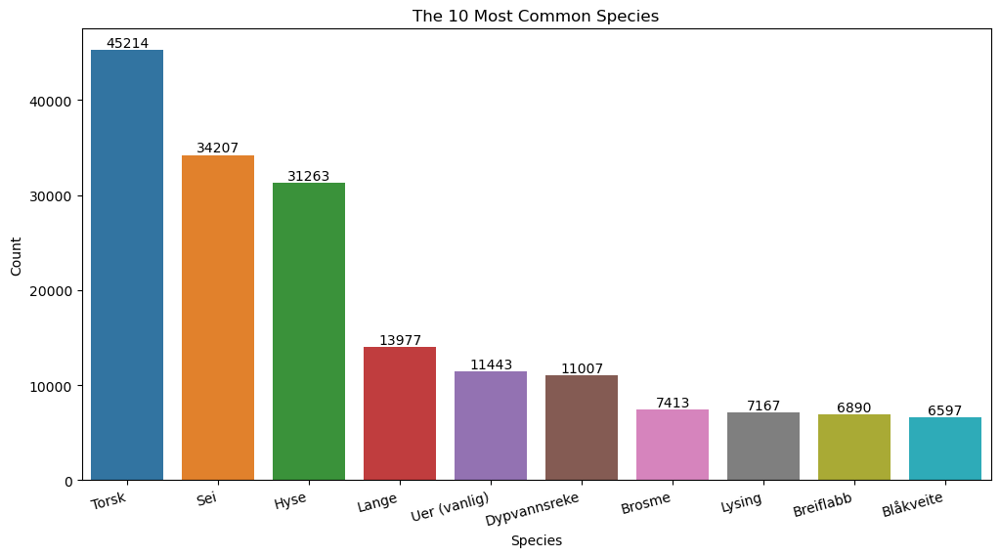

In [29]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Species', y='Total_Count', data=most_common_species)
ax.bar_label(ax.containers[0], fontsize=10); # their counts.
plt.xlabel('Species')
plt.ylabel('Count')
plt.title(f'The {most_common_range} Most Common Species')
plt.xticks(rotation=15, ha='right') 
plt.show()

In [30]:
set(most_common_species["Species"])

{'Blåkveite',
 'Breiflabb',
 'Brosme',
 'Dypvannsreke',
 'Hyse',
 'Lange',
 'Lysing',
 'Sei',
 'Torsk',
 'Uer (vanlig)'}

In [31]:
sorted_tools_counts

,Tool,Total_Count
0,Bunntrål,98313
1,Snurrevad,40068
2,Andre liner,35029
3,Reketrål,17891
4,Udefinert garn,15160
5,Udefinert trål,12319
6,Snurpenot/ringnot,7751
7,Teiner,5075
8,Bunntrål par,2455
9,Dobbeltrål,2330


In [32]:
most_common_tools = sorted_tools_counts[:most_common_range]
other_most_common_tools = sorted_tools_counts[most_common_range:]

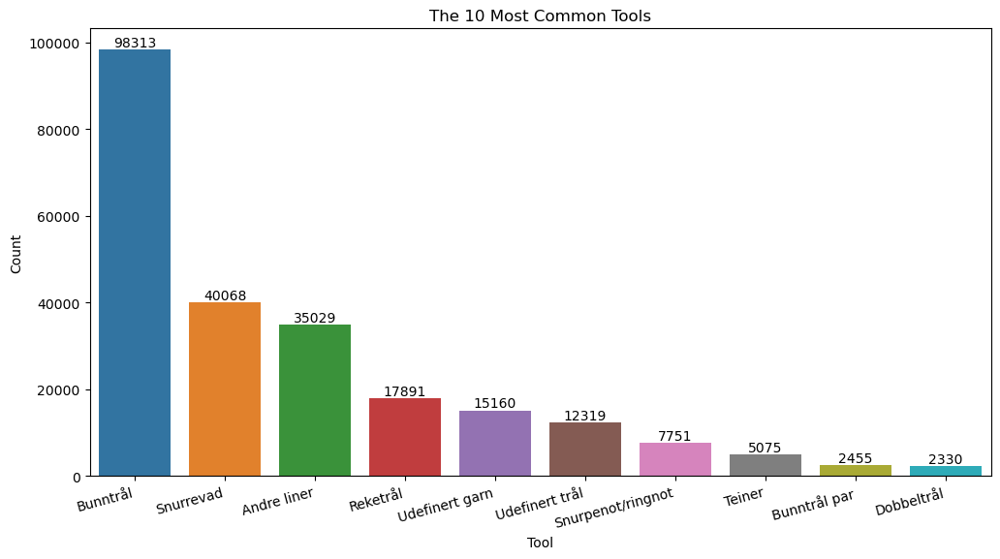

In [33]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Tool', y='Total_Count', data=most_common_tools)
ax.bar_label(ax.containers[0], fontsize=10); # their counts.
plt.xlabel('Tool')
plt.ylabel('Count')
plt.title(f'The {most_common_range} Most Common Tools')
plt.xticks(rotation=15, ha='right') 
plt.show()

In [34]:
import random
#Visualize a specific group, as an example, just to see the "normal" data in a group
group_keys = list(grouped_data_train.groups.keys())
random_group_key = random.choice(group_keys)
specific_group = grouped_data_train.get_group(random_group_key)

In [35]:
specific_group

,Melding ID,Meldingstidspunkt,Meldingsdato,Meldingsklokkeslett,Starttidspunkt,Startdato,Startklokkeslett,Startposisjon bredde,Startposisjon lengde,Hovedområde start (kode),...,Art - FDIR,Art - gruppe (kode),Art - gruppe,Rundvekt,Lengdegruppe (kode),Lengdegruppe,Bruttotonnasje 1969,Bruttotonnasje annen,Bredde,Fartøylengde
65832,1584854,01.04.2018 23:05,01.04.2018,23:05,01.04.2018 23:03,2018-04-01,23:03,67.669,12.247,5.0,...,Torsk,201.0,Torsk,17580.0,5.0,28 m og over,902.0,NaN,7.4,39.9
65833,1584854,01.04.2018 23:05,01.04.2018,23:05,01.04.2018 23:03,2018-04-01,23:03,67.669,12.247,5.0,...,Lange,220.0,Annen torskefisk,67.0,5.0,28 m og over,902.0,NaN,7.4,39.9


From here, we see that each catch, has the same time, showing off the different species, and that when they have another catch they again have a different time, we want to save these, but as less rows, we will come back to this later.

In [36]:
unique_startdates_counts = []

for name, group in grouped_data_train:
    unique_dates_count = len(group['Startdato'].unique())
        
    if unique_dates_count < 2:
        # ignore
        break
    elif unique_dates_count >= 2:
        unique_startdates_counts.append((name, unique_dates_count))

unique_startdates_counts

[]

We are making sure that there isnt a real big difference in the days inside each group, only one group has 2 different days(which we know are a day where its late, and it goes over to the next day, so this wont make a big difference), now we can group them togehter looking after their time, if the time is different inside the group we can make a new row, meaning that if they have the same time all the species have been caught at the same time, if not, then they have been caught at different times:

### 1.6 Classifying: Species & Tools <a id="section_1_6"></a>

We are going to classify our species, so that only the most common species/tools have their own `names` and the rest will be `other`

In [37]:
grouped_data_train["Hovedart FAO"].head()

0         Snøkrabbe
1         Snøkrabbe
2         Snøkrabbe
3         Snøkrabbe
4               Sei
            ...    
239776         Hyse
239777         Hyse
239778         Hyse
239779         Hyse
239780         Hyse
Name: Hovedart FAO, Length: 145027, dtype: object

In [38]:
type(grouped_data_train["Hovedart FAO"])

pandas.core.groupby.generic.SeriesGroupBy

In [39]:
most_common_species["Species"]

0           Torsk
1             Sei
2            Hyse
3           Lange
4    Uer (vanlig)
5    Dypvannsreke
6          Brosme
7          Lysing
8       Breiflabb
9       Blåkveite
Name: Species, dtype: object

Now we also need our grouped test data, since these are universal changes that need to be applied:

In [40]:
grouped_data_test = test_data.groupby('Melding ID')

In [41]:
grouped_data_test.groups

{1497229: [0, 1, 2], 1497314: [3, 4, 5, 6], 1497342: [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], 1497351: [20, 21], 1497377: [22, 23], 1497383: [24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39], 1497422: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52], 1497423: [53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67], 1497424: [68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79], 1497426: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92], 1497514: [93], 1497531: [94, 95, 96, 97, 98, 99], 1497562: [100, 101, 102], 1497581: [103, 104, 105, 106, 107, 108, 109], 1497634: [110, 111, 112, 113, 114, 115], 1497685: [116, 117, 118, 119, 120, 121], 1497687: [122, 123, 124, 125], 1497743: [126, 127, 128, 129], 1497779: [130, 131], 1497809: [132, 133, 134, 135, 136], 1497820: [137, 138, 139, 140, 141], 1497841: [142, 143, 144, 145, 146, 147], 1497850: [148, 149, 150], 1497857: [151, 152, 153, 154, 155, 156, 157], 1497883: [158, 159], 1497933: [160, 161, 162, 163, 164,

In [42]:
# beware! This code takes a while... (up to a few min.)
most_common_species_set = set(most_common_species["Species"])
most_common_tools_set = set(most_common_tools["Tool"])

def update_species_classification(group):
    group["Art - FDIR"] = group["Art - FDIR"].apply(lambda x: x if x in most_common_species_set else 'Other')
    group["Hovedart FAO"] = group["Hovedart FAO"].apply(lambda x: x if x in most_common_species_set else 'Other')
    group["Redskap FDIR"] = group["Redskap FDIR"].apply(lambda x: x if x in most_common_tools_set else 'Other')
    # if it's in common species/tools we keep it, else set it to "Other"
    return group
# Apply to both training and test data
updated_group_data_train = grouped_data_train.apply(update_species_classification).reset_index(drop=True)
updated_group_data_test = grouped_data_test.apply(update_species_classification).reset_index(drop=True)

In [43]:
updated_group_data_train #We see a few instanses of "other". But we see that we again group our data, but still maintain our dataframe object!

,Melding ID,Meldingstidspunkt,Meldingsdato,Meldingsklokkeslett,Starttidspunkt,Startdato,Startklokkeslett,Startposisjon bredde,Startposisjon lengde,Hovedområde start (kode),...,Art - FDIR,Art - gruppe (kode),Art - gruppe,Rundvekt,Lengdegruppe (kode),Lengdegruppe,Bruttotonnasje 1969,Bruttotonnasje annen,Bredde,Fartøylengde
0,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 01:19,2018-01-01,01:19,74.811,36.665,15.0,...,Other,501.0,Snøkrabbe,217.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
1,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 03:04,2018-01-01,03:04,74.835,36.744,15.0,...,Other,501.0,Snøkrabbe,217.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
2,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 11:57,2018-01-01,11:57,74.828,36.865,15.0,...,Other,501.0,Snøkrabbe,217.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
3,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 11:57,2018-01-01,11:57,74.828,36.866,15.0,...,Other,501.0,Snøkrabbe,220.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
4,1497288,01.01.2018 21:02,01.01.2018,21:02,01.01.2018 05:47,2018-01-01,05:47,69.744,16.516,5.0,...,Sei,203.0,Sei,2895.0,4.0,"21-27,99 m",NaN,354.0,9.0,27.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239798,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Other,304.0,Steinbiter,145.0,5.0,28 m og over,1483.0,NaN,12.6,57.30
239799,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Uer (vanlig),302.0,Uer,136.0,5.0,28 m og over,1483.0,NaN,12.6,57.30
239800,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Other,304.0,Steinbiter,132.0,5.0,28 m og over,1483.0,NaN,12.6,57.30
239801,1800291,01.01.2019 09:28,01.01.2019,09:28,31.12.2018 19:41,2018-12-31,19:41,76.906,12.709,21.0,...,Other,302.0,Uer,102.0,5.0,28 m og over,1483.0,NaN,12.6,57.30


In [44]:
type(updated_group_data_train)

pandas.core.frame.DataFrame

In [45]:
updated_group_data_train["Hovedart FAO"]

0         Other
1         Other
2         Other
3         Other
4           Sei
          ...  
239798     Hyse
239799     Hyse
239800     Hyse
239801     Hyse
239802     Hyse
Name: Hovedart FAO, Length: 239803, dtype: object

Now printing it out to see if it did an effect, and we do see some instances of the label: "other"!

In [46]:
updated_group_data_train["Art - FDIR"].head(100).to_string()

'0            Other\n1            Other\n2            Other\n3            Other\n4              Sei\n5            Torsk\n6     Uer (vanlig)\n7            Lange\n8             Hyse\n9            Other\n10           Torsk\n11            Hyse\n12           Other\n13           Other\n14    Uer (vanlig)\n15           Lange\n16           Other\n17             Sei\n18           Torsk\n19           Lange\n20           Other\n21             Sei\n22           Torsk\n23             Sei\n24           Other\n25           Other\n26       Breiflabb\n27           Torsk\n28           Torsk\n29            Hyse\n30           Other\n31           Torsk\n32             Sei\n33           Torsk\n34          Lysing\n35             Sei\n36          Lysing\n37             Sei\n38           Lange\n39            Hyse\n40           Torsk\n41           Other\n42           Other\n43    Uer (vanlig)\n44          Brosme\n45           Torsk\n46           Torsk\n47           Torsk\n48           Torsk\n49           Torsk\

In [47]:
updated_group_data_train["Hovedart FAO"].head(100).to_string()

'0      Other\n1      Other\n2      Other\n3      Other\n4        Sei\n5        Sei\n6        Sei\n7        Sei\n8        Sei\n9        Sei\n10     Torsk\n11     Torsk\n12     Torsk\n13     Torsk\n14     Torsk\n15     Lange\n16     Lange\n17     Lange\n18     Lange\n19     Lange\n20     Lange\n21     Lange\n22     Lange\n23       Sei\n24       Sei\n25       Sei\n26       Sei\n27       Sei\n28     Torsk\n29     Torsk\n30     Torsk\n31     Torsk\n32       Sei\n33       Sei\n34    Lysing\n35    Lysing\n36    Lysing\n37    Lysing\n38    Lysing\n39      Hyse\n40      Hyse\n41      Hyse\n42      Hyse\n43      Hyse\n44      Hyse\n45     Torsk\n46     Torsk\n47     Torsk\n48     Torsk\n49     Torsk\n50     Torsk\n51     Torsk\n52     Torsk\n53     Torsk\n54     Torsk\n55     Torsk\n56     Torsk\n57       Sei\n58       Sei\n59       Sei\n60     Torsk\n61     Torsk\n62       Sei\n63       Sei\n64     Torsk\n65     Torsk\n66     Torsk\n67     Torsk\n68     Torsk\n69     Torsk\n70     Torsk\n71   

In [48]:
updated_group_data_train["Redskap FDIR"].head(150).to_string()

'0              Teiner\n1              Teiner\n2              Teiner\n3              Teiner\n4      Udefinert garn\n5      Udefinert garn\n6      Udefinert garn\n7      Udefinert garn\n8      Udefinert garn\n9      Udefinert garn\n10        Andre liner\n11        Andre liner\n12        Andre liner\n13        Andre liner\n14        Andre liner\n15         Dobbeltrål\n16         Dobbeltrål\n17         Dobbeltrål\n18         Dobbeltrål\n19         Dobbeltrål\n20         Dobbeltrål\n21         Dobbeltrål\n22         Dobbeltrål\n23         Dobbeltrål\n24         Dobbeltrål\n25         Dobbeltrål\n26         Dobbeltrål\n27         Dobbeltrål\n28           Bunntrål\n29           Bunntrål\n30           Bunntrål\n31        Andre liner\n32          Snurrevad\n33          Snurrevad\n34     Udefinert trål\n35     Udefinert trål\n36     Udefinert trål\n37     Udefinert trål\n38     Udefinert trål\n39        Andre liner\n40        Andre liner\n41        Andre liner\n42        Andre liner\n43        

### 1.7 Grouped data: for visualization and beyond <a id="section_1_7"></a>

In [49]:
# Grouping onnce again
Grouped_data_train = updated_group_data_train.groupby("Melding ID")
Grouped_data_test = updated_group_data_test.groupby("Melding ID")

In [50]:
Grouped_data_train.head()

,Melding ID,Meldingstidspunkt,Meldingsdato,Meldingsklokkeslett,Starttidspunkt,Startdato,Startklokkeslett,Startposisjon bredde,Startposisjon lengde,Hovedområde start (kode),...,Art - FDIR,Art - gruppe (kode),Art - gruppe,Rundvekt,Lengdegruppe (kode),Lengdegruppe,Bruttotonnasje 1969,Bruttotonnasje annen,Bredde,Fartøylengde
0,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 01:19,2018-01-01,01:19,74.811,36.665,15.0,...,Other,501.0,Snøkrabbe,217.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
1,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 03:04,2018-01-01,03:04,74.835,36.744,15.0,...,Other,501.0,Snøkrabbe,217.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
2,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 11:57,2018-01-01,11:57,74.828,36.865,15.0,...,Other,501.0,Snøkrabbe,217.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
3,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 11:57,2018-01-01,11:57,74.828,36.866,15.0,...,Other,501.0,Snøkrabbe,220.0,5.0,28 m og over,NaN,1101.0,11.2,49.95
4,1497288,01.01.2018 21:02,01.01.2018,21:02,01.01.2018 05:47,2018-01-01,05:47,69.744,16.516,5.0,...,Sei,203.0,Sei,2895.0,4.0,"21-27,99 m",NaN,354.0,9.0,27.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239776,1800291,01.01.2019 09:28,01.01.2019,09:28,30.12.2018 23:20,2018-12-30,23:20,76.509,14.295,21.0,...,Hyse,202.0,Hyse,7277.0,5.0,28 m og over,1483.0,NaN,12.6,57.30
239777,1800291,01.01.2019 09:28,01.01.2019,09:28,30.12.2018 23:20,2018-12-30,23:20,76.509,14.295,21.0,...,Torsk,201.0,Torsk,3126.0,5.0,28 m og over,1483.0,NaN,12.6,57.30
239778,1800291,01.01.2019 09:28,01.01.2019,09:28,30.12.2018 23:20,2018-12-30,23:20,76.509,14.295,21.0,...,Blåkveite,301.0,Blåkveite,315.0,5.0,28 m og over,1483.0,NaN,12.6,57.30
239779,1800291,01.01.2019 09:28,01.01.2019,09:28,30.12.2018 23:20,2018-12-30,23:20,76.509,14.295,21.0,...,Other,304.0,Steinbiter,145.0,5.0,28 m og over,1483.0,NaN,12.6,57.30


Keeping a dataframe of the most import information for now, some info for visualization and some for futher exploration

In [51]:
species_order = ['Torsk', 'Sei', 'Hyse', 'Lange', 'Uer(vanlig)', 'Dypvannsreke', 'Other'] #Defined afte some of the most common (see previous sections)

def process_grouped_data(grouped_data_gen, species_order):
    result_rows = []

    for name, group in grouped_data_gen:
        common_info = {
            'Melding ID': name,
            'latitude': group['Startposisjon bredde'].iloc[0],
            'longitude': group['Startposisjon lengde'].iloc[0],
            'main_species': group['Hovedart FAO'].iloc[0], # only for visualization
            'vessel_ratio(height/width)': group['Fartøylengde'].iloc[0] / group['Bredde'].iloc[0],
            'start_date': group['Startdato'].iloc[0],
            'time_duration': group['Varighet'].iloc[0],
            'total_weight': group['Rundvekt'].sum(), # only for visualization
            'times': group['Startklokkeslett'].iloc[0],
            'tools_used': group['Redskap FDIR'].iloc[0],
            'species_weights_list': [group.loc[group['Art - FDIR'] == species, 'Rundvekt'].sum() for species in species_order] # target feature
        }

        result_rows.append(common_info)

    result_df = pd.DataFrame(result_rows)
    return result_df

# for both the training and test set here:
result_df_train = process_grouped_data(Grouped_data_train, species_order)
result_df_test = process_grouped_data(Grouped_data_test, species_order)


In [52]:
result_df_train

,Melding ID,latitude,longitude,main_species,vessel_ratio(height/width),start_date,time_duration,total_weight,times,tools_used,species_weights_list
0,1497249,74.811,36.665,Other,4.459821,2018-01-01,101,871.0,01:19,Teiner,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 871.0]"
1,1497288,69.744,16.516,Sei,3.054444,2018-01-01,881,5304.0,05:47,Udefinert garn,"[2100.0, 2895.0, 54.0, 95.0, 0.0, 0.0, 16.0]"
2,1497306,72.866,29.105,Torsk,4.658000,2018-01-01,900,11321.0,07:00,Andre liner,"[8371.0, 0.0, 2257.0, 0.0, 0.0, 0.0, 660.0]"
3,1497310,58.636,0.876,Lange,3.467143,2018-01-01,249,2994.0,07:09,Dobbeltrål,"[188.0, 480.0, 0.0, 1392.0, 0.0, 0.0, 874.0]"
4,1497311,73.127,28.324,Torsk,4.014286,2018-01-01,87,4131.0,17:09,Bunntrål,"[3850.0, 0.0, 202.0, 0.0, 0.0, 0.0, 79.0]"
...,...,...,...,...,...,...,...,...,...,...,...
36795,1800267,72.840,28.893,Torsk,4.148438,2018-12-31,1138,28453.0,04:00,Andre liner,"[22110.0, 0.0, 6343.0, 0.0, 0.0, 0.0, 0.0]"
36796,1800269,70.844,50.071,Hyse,4.271429,2018-12-31,1226,25363.0,02:34,Andre liner,"[10107.0, 0.0, 15201.0, 0.0, 0.0, 0.0, 55.0]"
36797,1800285,74.892,17.255,Torsk,4.410256,2018-12-31,317,29247.0,00:26,Bunntrål,"[20316.0, 0.0, 7303.0, 0.0, 0.0, 0.0, 667.0]"
36798,1800286,70.888,22.321,Sei,3.789524,2018-12-31,152,20262.0,09:50,Bunntrål,"[4117.0, 15749.0, 258.0, 0.0, 0.0, 0.0, 138.0]"


One thing to mention is our `species_order` (above), this order will be maintained troughout our project and we will later explore what we will do with this data. Also see that some of our times, just have a singular item in them, we will keep this in mind for later. (See `Encoding` later)

And another thing is our `time` variable, we are taking the first one out of the group, this represents their first time of actually starting the expedition *(the first catch)*.

In [53]:
type(result_df_train)

pandas.core.frame.DataFrame

In [54]:
result_df_train["species_weights_list"]

0                 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 871.0]
1          [2100.0, 2895.0, 54.0, 95.0, 0.0, 0.0, 16.0]
2           [8371.0, 0.0, 2257.0, 0.0, 0.0, 0.0, 660.0]
3          [188.0, 480.0, 0.0, 1392.0, 0.0, 0.0, 874.0]
4             [3850.0, 0.0, 202.0, 0.0, 0.0, 0.0, 79.0]
                              ...                      
36795        [22110.0, 0.0, 6343.0, 0.0, 0.0, 0.0, 0.0]
36796      [10107.0, 0.0, 15201.0, 0.0, 0.0, 0.0, 55.0]
36797      [20316.0, 0.0, 7303.0, 0.0, 0.0, 0.0, 667.0]
36798    [4117.0, 15749.0, 258.0, 0.0, 0.0, 0.0, 138.0]
36799    [16725.0, 32.0, 27144.0, 0.0, 0.0, 0.0, 998.0]
Name: species_weights_list, Length: 36800, dtype: object

This group data will be mainly used for representing and visualizing, so beware of its name, since it only has one element per trip, which we want to use!

In [55]:
group_data = result_df_train.groupby('Melding ID') 

In [56]:
group_data.groups

{1497249: [0], 1497288: [1], 1497306: [2], 1497310: [3], 1497311: [4], 1497312: [5], 1497321: [6], 1497323: [7], 1497326: [8], 1497330: [9], 1497332: [10], 1497341: [11], 1497344: [12], 1497350: [13], 1497352: [14], 1497353: [15], 1497354: [16], 1497358: [17], 1497362: [18], 1497364: [19], 1497368: [20], 1497384: [21], 1497414: [22], 1497421: [23], 1497432: [24], 1497433: [25], 1497435: [26], 1497444: [27], 1497448: [28], 1497475: [29], 1497482: [30], 1497484: [31], 1497495: [32], 1497505: [33], 1497537: [34], 1497550: [35], 1497555: [36], 1497556: [37], 1497559: [38], 1497589: [39], 1497600: [40], 1497621: [41], 1497628: [42], 1497631: [43], 1497659: [44], 1497681: [45], 1497686: [46], 1497692: [47], 1497719: [48], 1497720: [49], 1497758: [50], 1497776: [51], 1497784: [52], 1497789: [53], 1497801: [54], 1497803: [55], 1497805: [56], 1497812: [57], 1497816: [58], 1497818: [59], 1497823: [60], 1497824: [61], 1497827: [62], 1497833: [63], 1497836: [64], 1497838: [65], 1497839: [66], 1497

In [57]:
group_data.head()

,Melding ID,latitude,longitude,main_species,vessel_ratio(height/width),start_date,time_duration,total_weight,times,tools_used,species_weights_list
0,1497249,74.811,36.665,Other,4.459821,2018-01-01,101,871.0,01:19,Teiner,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 871.0]"
1,1497288,69.744,16.516,Sei,3.054444,2018-01-01,881,5304.0,05:47,Udefinert garn,"[2100.0, 2895.0, 54.0, 95.0, 0.0, 0.0, 16.0]"
2,1497306,72.866,29.105,Torsk,4.658000,2018-01-01,900,11321.0,07:00,Andre liner,"[8371.0, 0.0, 2257.0, 0.0, 0.0, 0.0, 660.0]"
3,1497310,58.636,0.876,Lange,3.467143,2018-01-01,249,2994.0,07:09,Dobbeltrål,"[188.0, 480.0, 0.0, 1392.0, 0.0, 0.0, 874.0]"
4,1497311,73.127,28.324,Torsk,4.014286,2018-01-01,87,4131.0,17:09,Bunntrål,"[3850.0, 0.0, 202.0, 0.0, 0.0, 0.0, 79.0]"
...,...,...,...,...,...,...,...,...,...,...,...
36795,1800267,72.840,28.893,Torsk,4.148438,2018-12-31,1138,28453.0,04:00,Andre liner,"[22110.0, 0.0, 6343.0, 0.0, 0.0, 0.0, 0.0]"
36796,1800269,70.844,50.071,Hyse,4.271429,2018-12-31,1226,25363.0,02:34,Andre liner,"[10107.0, 0.0, 15201.0, 0.0, 0.0, 0.0, 55.0]"
36797,1800285,74.892,17.255,Torsk,4.410256,2018-12-31,317,29247.0,00:26,Bunntrål,"[20316.0, 0.0, 7303.0, 0.0, 0.0, 0.0, 667.0]"
36798,1800286,70.888,22.321,Sei,3.789524,2018-12-31,152,20262.0,09:50,Bunntrål,"[4117.0, 15749.0, 258.0, 0.0, 0.0, 0.0, 138.0]"


Much better, now actually showing each group with the same "Melding ID" as one group, containing multiple catches and their corresponding species and weights, and so on...

We want the whole dataset, as it is now, to use for our unsupervised learning algorithm, which we can combine here:

In [58]:
combined_df = pd.concat([result_df_train, result_df_test], ignore_index=True)

### 1.8 Scatter plot of groups - so far <a id="section_1_8"></a>

It would be beneficial to show some of the information, like the `Vessel Ratio` comparied to the `total weight` for each group, to be represented.

In [59]:
total_catch_by_group = group_data["total_weight"].sum()
vessel_size_by_group = group_data["vessel_ratio(height/width)"].first()

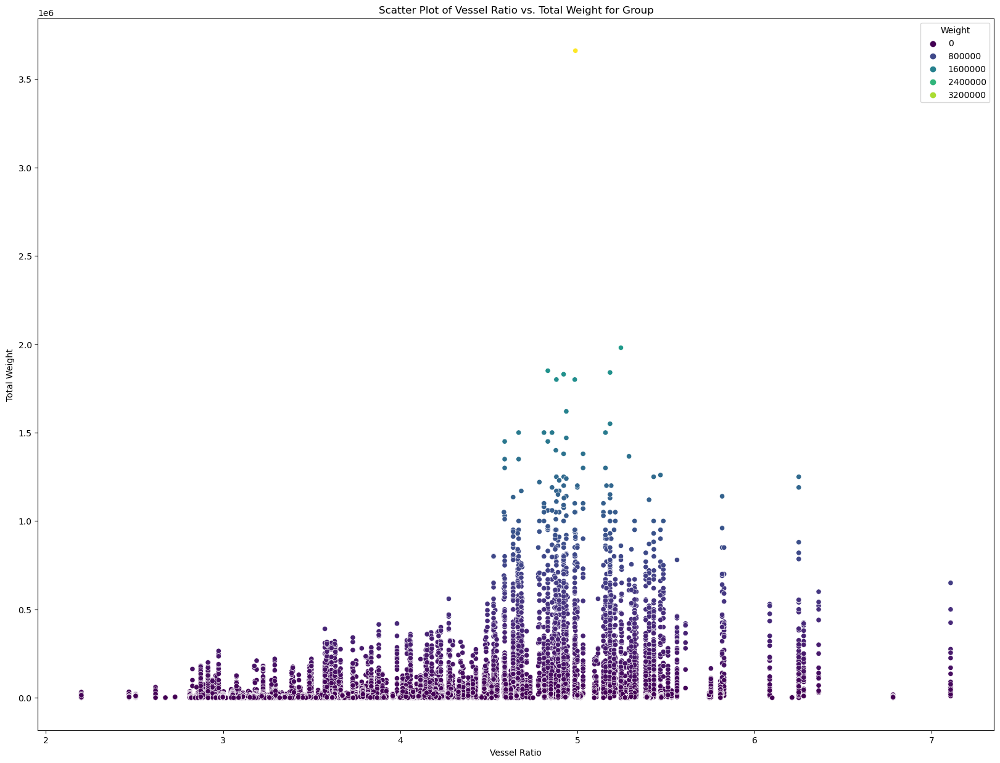

In [60]:
scatter_data = pd.DataFrame({ # only for representation, for now.
    'Melding ID': total_catch_by_group.index,
    'Total Weight': total_catch_by_group.values,
    'Vessel Ratio': vessel_size_by_group.values
})

plt.figure(figsize=(20, 15))
sns.scatterplot(x='Vessel Ratio', y='Total Weight', hue='Total Weight', data=scatter_data, palette='viridis')
plt.title('Scatter Plot of Vessel Ratio vs. Total Weight for Group')
plt.xlabel('Vessel Ratio')
plt.ylabel('Total Weight')
plt.legend(title='Weight')
plt.show()

This isnt really giving us the best representation out there, but it is a good start! Since most of these groups will be a lot smaller than some of the really bigger ones, its hard to represent them all in one plot together, so this will be our starting point.

In [61]:
scatter_data.head()

,Melding ID,Total Weight,Vessel Ratio
0,1497249,871.0,4.459821
1,1497288,5304.0,3.054444
2,1497306,11321.0,4.658000
3,1497310,2994.0,3.467143
4,1497311,4131.0,4.014286


### 1.9 Heatmap distribution  <a id="section_1_9"></a>

We want a simple heatmap distribution, we are going to do this with Plotly's map, this will give us a map that will be detailed with some hover information and give us good insight, where most of our (training) data lies, this is all from: https://plotly.com/python/maps/

In [62]:
fig = px.density_mapbox(
    result_df_train, 
    lat='latitude',  
    lon='longitude', 
    z='total_weight',
    hover_data=['main_species','Melding ID'],
    radius=10,
    zoom=3,
    height=300
)



fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 0, "l": 0, "b": 0}
)
fig.show()

### 2.0 Bubblemap distribution  <a id="section_2_0"></a>

It would also be hepful to get it to a scatter map, like a bubble map and show our data here: (again from Plotly, see previous section for more info)

In [63]:
sampled_data = result_df_train.sample(frac=0.05) 
fig = px.scatter_geo(
    sampled_data, 
    lat='latitude', 
    lon='longitude', 
    color="main_species", 
    hover_name="Melding ID", 
    size="total_weight", 
    projection="natural earth",
    scope="europe"  
)

fig.show()

### 2.1 Encoding: CyclicalEncoding<a id="section_2_1"></a>

I recommend troughout this chapter to read upon `FeatureEngines documentation about cyclical encoding`, as i will follow it closely, Read more: https://feature-engine.trainindata.com/en/latest/user_guide/creation/CyclicalFeatures.html#

We are going to cyclical encode our time, both the months, date and hours, we will not take year (or years) in consideration, as all in this project is happening in 2018.

In [64]:
cyclical = CyclicalFeatures(variables = None)

In [65]:
def transform_from_hour_to_cyclical(df):
    test_dataframe = df.to_frame() # to dataframe
    values_test = test_dataframe["times"].values # its values
    reshape_test = values_test.reshape(-1,1) # reshape to 1D format
    hours_list = np.char.split(reshape_test.astype(str), ":").tolist() # Split to ["Hour", "Minute"]
    hours_list = [value[0][:1] for value in hours_list] # keep only ["Hour"]
    df_hours = pd.DataFrame(hours_list, columns=['Hour']) # create new dataframe with "Hour"-col.
    df_hours['Hour'] = pd.to_numeric(df_hours['Hour']) # ensure its numeric.
    return df_hours
    
new_hour_df_test = transform_from_hour_to_cyclical(result_df_train["times"])

In [66]:
test = cyclical.fit_transform(new_hour_df_test[["Hour"]]) #selecting dataframe!
test.head() 

,Hour,Hour_sin,Hour_cos
0,1,0.269797,0.962917
1,5,0.979084,0.203456
2,7,0.942261,-0.334880
3,7,0.942261,-0.334880
4,17,-0.997669,-0.068242


We can see the correlation by their website (`feature-engine`) and visualize it as a `circle`. From the following page: https://feature-engine.trainindata.com/en/latest/user_guide/creation/CyclicalFeatures.html#

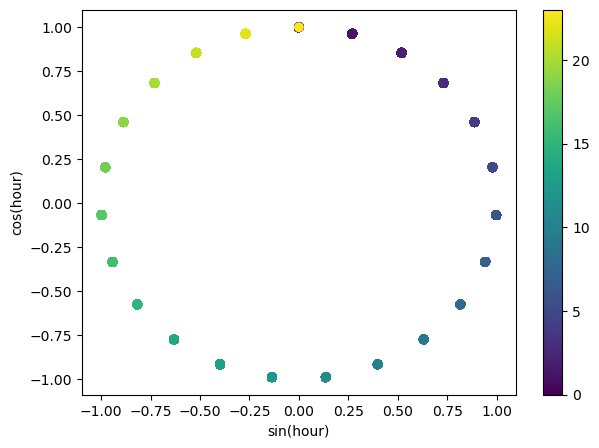

In [67]:
fig, ax = plt.subplots(figsize=(7, 5))
sp = ax.scatter(test["Hour_sin"], test["Hour_cos"], c=test["Hour"])
ax.set(
    xlabel="sin(hour)",
    ylabel="cos(hour)",
)
_ = fig.colorbar(sp)

Visualizing the (x,y) cicle coordinates generated by the sine and cosine features.

Now we can actually, place these values in our dataframe, but this will be two features now, instead of one:

In [68]:
cyclical = CyclicalFeatures(variables = None, drop_original=True) # we can drop the orig. featues, no use for us now.
new_hour_df_train = transform_from_hour_to_cyclical(result_df_train["times"])
new_hour_df_test = transform_from_hour_to_cyclical(result_df_test["times"])
hour_train = cyclical.fit_transform(new_hour_df_train[["Hour"]]) #selecting dataframe!
hour_test = cyclical.fit_transform(new_hour_df_test[["Hour"]]) #selecting dataframe!
hour_train.head() 

,Hour_sin,Hour_cos
0,0.269797,0.962917
1,0.979084,0.203456
2,0.942261,-0.334880
3,0.942261,-0.334880
4,-0.997669,-0.068242


In [69]:
result_df_train.reset_index(drop=True, inplace=True) # avoiding potential issues when concatination is happening...
hour_train.reset_index(drop=True, inplace=True)

result_df_train = pd.concat([result_df_train, hour_train[['Hour_sin', 'Hour_cos']]], axis=1) # adding to original dataframe

In [70]:
result_df_test.reset_index(drop=True, inplace=True) # avoiding potential issues when concatination is happening...
hour_test.reset_index(drop=True, inplace=True)

result_df_test = pd.concat([result_df_test, hour_test[['Hour_sin', 'Hour_cos']]], axis=1) # adding to original dataframe

In [71]:
result_df_train.drop("times", axis=1, inplace=True) # we can remove start_time as we now have a encoded version.
result_df_test.drop("times", axis=1, inplace=True) # we can remove start_time as we now have a encoded version.

In [72]:
result_df_train

,Melding ID,latitude,longitude,main_species,vessel_ratio(height/width),start_date,time_duration,total_weight,tools_used,species_weights_list,Hour_sin,Hour_cos
0,1497249,74.811,36.665,Other,4.459821,2018-01-01,101,871.0,Teiner,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 871.0]",2.697968e-01,0.962917
1,1497288,69.744,16.516,Sei,3.054444,2018-01-01,881,5304.0,Udefinert garn,"[2100.0, 2895.0, 54.0, 95.0, 0.0, 0.0, 16.0]",9.790841e-01,0.203456
2,1497306,72.866,29.105,Torsk,4.658000,2018-01-01,900,11321.0,Andre liner,"[8371.0, 0.0, 2257.0, 0.0, 0.0, 0.0, 660.0]",9.422609e-01,-0.334880
3,1497310,58.636,0.876,Lange,3.467143,2018-01-01,249,2994.0,Dobbeltrål,"[188.0, 480.0, 0.0, 1392.0, 0.0, 0.0, 874.0]",9.422609e-01,-0.334880
4,1497311,73.127,28.324,Torsk,4.014286,2018-01-01,87,4131.0,Bunntrål,"[3850.0, 0.0, 202.0, 0.0, 0.0, 0.0, 79.0]",-9.976688e-01,-0.068242
...,...,...,...,...,...,...,...,...,...,...,...,...
36795,1800267,72.840,28.893,Torsk,4.148438,2018-12-31,1138,28453.0,Andre liner,"[22110.0, 0.0, 6343.0, 0.0, 0.0, 0.0, 0.0]",8.878852e-01,0.460065
36796,1800269,70.844,50.071,Hyse,4.271429,2018-12-31,1226,25363.0,Andre liner,"[10107.0, 0.0, 15201.0, 0.0, 0.0, 0.0, 55.0]",5.195840e-01,0.854419
36797,1800285,74.892,17.255,Torsk,4.410256,2018-12-31,317,29247.0,Bunntrål,"[20316.0, 0.0, 7303.0, 0.0, 0.0, 0.0, 667.0]",0.000000e+00,1.000000
36798,1800286,70.888,22.321,Sei,3.789524,2018-12-31,152,20262.0,Bunntrål,"[4117.0, 15749.0, 258.0, 0.0, 0.0, 0.0, 138.0]",6.310879e-01,-0.775711


Now we have encoded our hour (time) by cyclical encoding, we want to do the same for our dates.

In [73]:
result_df_train[["start_date"]]

,start_date
0,2018-01-01
1,2018-01-01
2,2018-01-01
3,2018-01-01
4,2018-01-01
...,...
36795,2018-12-31
36796,2018-12-31
36797,2018-12-31
36798,2018-12-31


Beware they are dateFrame objects, so we have to handle them differently than previously with time, this because of our splitting method, check out `Splitting our data` section above.

In [74]:
def transform_from_date_to_cyclical(df):
    # Converting the dataframe to a dataframe if it isnt already.
    test_dataframe = df.to_frame() if not isinstance(df, pd.DataFrame) else df
    values_test = test_dataframe["start_date"].values
    date_list = pd.to_datetime(values_test).strftime('%Y-%m-%d').str.split("-").tolist() # splitting to date, monnth, year
    date_list = [[value[1], value[2]] for value in date_list]# GEtting both the month and date, not year
    df_dates = pd.DataFrame(date_list, columns=['Month', 'Day'])
    df_dates['Day'] = pd.to_numeric(df_dates['Day']) # to numeric values
    df_dates['Month'] = pd.to_numeric(df_dates['Month']) 
    
    return df_dates

In [75]:
new_date_df_train = transform_from_date_to_cyclical(result_df_train["start_date"])
new_date_df_test = transform_from_date_to_cyclical(result_df_test["start_date"])
new_date_df_train

,Month,Day
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
36795,12,31
36796,12,31
36797,12,31
36798,12,31


In [76]:
date_cyclical_train = cyclical.fit_transform(new_date_df_train[["Day", "Month"]]) #selecting dataframe
date_cyclical_test = cyclical.fit_transform(new_date_df_test[["Day", "Month"]])

In [77]:
date_cyclical_train.head() 

,Day_sin,Day_cos,Month_sin,Month_cos
0,0.201299,0.97953,0.5,0.866025
1,0.201299,0.97953,0.5,0.866025
2,0.201299,0.97953,0.5,0.866025
3,0.201299,0.97953,0.5,0.866025
4,0.201299,0.97953,0.5,0.866025


In [78]:
result_df_train.reset_index(drop=True, inplace=True) # avoiding potential issues when concatination is happening...
date_cyclical_train.reset_index(drop=True, inplace=True)

result_df_train = pd.concat([result_df_train, date_cyclical_train[['Day_sin', 'Day_cos', 'Month_sin', 'Month_cos']]], axis=1) # adding to original dataframe

In [79]:
result_df_test.reset_index(drop=True, inplace=True) # avoiding potential issues when concatination is happening...
date_cyclical_test.reset_index(drop=True, inplace=True)

result_df_test = pd.concat([result_df_test, date_cyclical_test[['Day_sin', 'Day_cos', 'Month_sin', 'Month_cos']]], axis=1) # adding to original datafram

When concating here we want to make sure that no extra values are being added and then just "wiped" off, we make sure of this by doing the following: ::: #TO DO

In [80]:
result_df_train.drop("start_date", axis=1, inplace=True) # we can remove start_date as we now have a encoded version.
result_df_test.drop("start_date", axis=1, inplace=True) # we can remove start_date as we now have a encoded version.

We are going to remove the total_weight, since it wont be used to predict anything in our model. As well as our main_species, these were both used for visual information before.

In [81]:
result_df_train.drop("total_weight", axis=1, inplace=True) # we can remove total_weight
result_df_test.drop("total_weight", axis=1, inplace=True) # we can remove total_weight

In [82]:
result_df_train.drop("main_species", axis=1, inplace=True) # we can remove main_species
result_df_test.drop("main_species", axis=1, inplace=True) # we can remove main_species

In [83]:
result_df_train

,Melding ID,latitude,longitude,vessel_ratio(height/width),time_duration,tools_used,species_weights_list,Hour_sin,Hour_cos,Day_sin,Day_cos,Month_sin,Month_cos
0,1497249,74.811,36.665,4.459821,101,Teiner,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 871.0]",2.697968e-01,0.962917,2.012985e-01,0.97953,5.000000e-01,0.866025
1,1497288,69.744,16.516,3.054444,881,Udefinert garn,"[2100.0, 2895.0, 54.0, 95.0, 0.0, 0.0, 16.0]",9.790841e-01,0.203456,2.012985e-01,0.97953,5.000000e-01,0.866025
2,1497306,72.866,29.105,4.658000,900,Andre liner,"[8371.0, 0.0, 2257.0, 0.0, 0.0, 0.0, 660.0]",9.422609e-01,-0.334880,2.012985e-01,0.97953,5.000000e-01,0.866025
3,1497310,58.636,0.876,3.467143,249,Dobbeltrål,"[188.0, 480.0, 0.0, 1392.0, 0.0, 0.0, 874.0]",9.422609e-01,-0.334880,2.012985e-01,0.97953,5.000000e-01,0.866025
4,1497311,73.127,28.324,4.014286,87,Bunntrål,"[3850.0, 0.0, 202.0, 0.0, 0.0, 0.0, 79.0]",-9.976688e-01,-0.068242,2.012985e-01,0.97953,5.000000e-01,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36795,1800267,72.840,28.893,4.148438,1138,Andre liner,"[22110.0, 0.0, 6343.0, 0.0, 0.0, 0.0, 0.0]",8.878852e-01,0.460065,-2.449294e-16,1.00000,-2.449294e-16,1.000000
36796,1800269,70.844,50.071,4.271429,1226,Andre liner,"[10107.0, 0.0, 15201.0, 0.0, 0.0, 0.0, 55.0]",5.195840e-01,0.854419,-2.449294e-16,1.00000,-2.449294e-16,1.000000
36797,1800285,74.892,17.255,4.410256,317,Bunntrål,"[20316.0, 0.0, 7303.0, 0.0, 0.0, 0.0, 667.0]",0.000000e+00,1.000000,-2.449294e-16,1.00000,-2.449294e-16,1.000000
36798,1800286,70.888,22.321,3.789524,152,Bunntrål,"[4117.0, 15749.0, 258.0, 0.0, 0.0, 0.0, 138.0]",6.310879e-01,-0.775711,-2.449294e-16,1.00000,-2.449294e-16,1.000000


In [84]:
type(result_df_train['species_weights_list'])

pandas.core.series.Series

### 2.2 Scaling: Normalization and more<a id="section_2_2"></a>

Before we apply it to our sum_based_normalization function we want to scale it, we are going to use Min-Max scaler, EXPLAIN WHY.

In [85]:
weights_series_train = result_df_train['species_weights_list']
weights_df_train = pd.DataFrame(weights_series_train.tolist(), index=result_df_train.index)
# we are creating a dataframe with our scaled values, for representing how our scaled values are.
scaled_weights_df_train = pd.DataFrame(minmax_scaler.fit_transform(weights_df_train), columns=weights_df_train.columns, index=weights_df_train.index)

weights_series_test = result_df_test['species_weights_list']
weights_df_test = pd.DataFrame(weights_series_test.tolist(), index=result_df_test.index)
# we are creating a dataframe with our scaled values, for representing how our scaled values are.
scaled_weights_df_test = pd.DataFrame(minmax_scaler.fit_transform(weights_df_test), columns=weights_df_test.columns, index=weights_df_test.index)

In [86]:
scaled_weights_df_train

,0,1,2,3,4,5,6
0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000238
1,0.004719,0.011092,0.000475,0.004934,0.0,0.0,0.000004
2,0.018811,0.000000,0.019853,0.000000,0.0,0.0,0.000180
3,0.000422,0.001839,0.000000,0.072289,0.0,0.0,0.000239
4,0.008652,0.000000,0.001777,0.000000,0.0,0.0,0.000022
...,...,...,...,...,...,...,...
36795,0.049686,0.000000,0.055793,0.000000,0.0,0.0,0.000000
36796,0.022713,0.000000,0.133708,0.000000,0.0,0.0,0.000015
36797,0.045655,0.000000,0.064237,0.000000,0.0,0.0,0.000182
36798,0.009252,0.060341,0.002269,0.000000,0.0,0.0,0.000038


In [87]:
# simple sum_based_normalization tecnique, if its 0 we want to make sure its still 0, rest is quite self-explanatory.
def sum_based_normalization(x):
    total_sum = sum(x)
    normed = [float(i) / total_sum if total_sum != 0 else 0 for i in x]
    return normed

In [88]:
# we used softmax before
normalization_weights_df_train = scaled_weights_df_train.apply(sum_based_normalization, axis=1)

result_df_train['species_weights_list'] = normalization_weights_df_train.values.tolist()

normalization_weights_df_test = scaled_weights_df_test.apply(sum_based_normalization, axis=1)

result_df_test['species_weights_list'] = normalization_weights_df_test.values.tolist()

In [89]:
result_df_train

,Melding ID,latitude,longitude,vessel_ratio(height/width),time_duration,tools_used,species_weights_list,Hour_sin,Hour_cos,Day_sin,Day_cos,Month_sin,Month_cos
0,1497249,74.811,36.665,4.459821,101,Teiner,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",2.697968e-01,0.962917,2.012985e-01,0.97953,5.000000e-01,0.866025
1,1497288,69.744,16.516,3.054444,881,Udefinert garn,"[0.2223503753251861, 0.5226136974019973, 0.022...",9.790841e-01,0.203456,2.012985e-01,0.97953,5.000000e-01,0.866025
2,1497306,72.866,29.105,4.658000,900,Andre liner,"[0.4842780764348872, 0.0, 0.5110796099926982, ...",9.422609e-01,-0.334880,2.012985e-01,0.97953,5.000000e-01,0.866025
3,1497310,58.636,0.876,3.467143,249,Dobbeltrål,"[0.005648888357181467, 0.024590084867846508, 0...",9.422609e-01,-0.334880,2.012985e-01,0.97953,5.000000e-01,0.866025
4,1497311,73.127,28.324,4.014286,87,Bunntrål,"[0.8279094299794811, 0.0, 0.1700250839952644, ...",-9.976688e-01,-0.068242,2.012985e-01,0.97953,5.000000e-01,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36795,1800267,72.840,28.893,4.148438,1138,Andre liner,"[0.47105121379633835, 0.0, 0.5289487862036616,...",8.878852e-01,0.460065,-2.449294e-16,1.00000,-2.449294e-16,1.000000
36796,1800269,70.844,50.071,4.271429,1226,Andre liner,"[0.1451884738353054, 0.0, 0.8547154654897384, ...",5.195840e-01,0.854419,-2.449294e-16,1.00000,-2.449294e-16,1.000000
36797,1800285,74.892,17.255,4.410256,317,Bunntrål,"[0.41476232791645434, 0.0, 0.5835820546036395,...",0.000000e+00,1.000000,-2.449294e-16,1.00000,-2.449294e-16,1.000000
36798,1800286,70.888,22.321,3.789524,152,Bunntrål,"[0.12867629450715945, 0.8392363958041694, 0.03...",6.310879e-01,-0.775711,-2.449294e-16,1.00000,-2.449294e-16,1.000000


In [90]:
result_df_train["species_weights_list"].iloc[0] # quite interesting, meaning that all values are of "other" category!

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]

In [91]:
result_df_train.head()

,Melding ID,latitude,longitude,vessel_ratio(height/width),time_duration,tools_used,species_weights_list,Hour_sin,Hour_cos,Day_sin,Day_cos,Month_sin,Month_cos
0,1497249,74.811,36.665,4.459821,101,Teiner,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",0.269797,0.962917,0.201299,0.97953,0.5,0.866025
1,1497288,69.744,16.516,3.054444,881,Udefinert garn,"[0.2223503753251861, 0.5226136974019973, 0.022...",0.979084,0.203456,0.201299,0.97953,0.5,0.866025
2,1497306,72.866,29.105,4.658000,900,Andre liner,"[0.4842780764348872, 0.0, 0.5110796099926982, ...",0.942261,-0.334880,0.201299,0.97953,0.5,0.866025
3,1497310,58.636,0.876,3.467143,249,Dobbeltrål,"[0.005648888357181467, 0.024590084867846508, 0...",0.942261,-0.334880,0.201299,0.97953,0.5,0.866025
4,1497311,73.127,28.324,4.014286,87,Bunntrål,"[0.8279094299794811, 0.0, 0.1700250839952644, ...",-0.997669,-0.068242,0.201299,0.97953,0.5,0.866025


In [92]:
result_df_train["species_weights_list"].iloc[2] 

[0.4842780764348872,
 0.0,
 0.5110796099926982,
 0.0,
 0.0,
 0.0,
 0.004642313572414772]

Using min-max scaling on our time_duration, because we want to not care to much about outliers and we want to perserve the original distribution, we also want them to stay between 0 - 1, for simplicity and since some of our other data does aswell.

In [93]:
result_df_train['time_duration'] = standard_scaler.fit_transform(result_df_train[['time_duration']]) 
result_df_test['time_duration'] = standard_scaler.fit_transform(result_df_test[['time_duration']]) 

In [94]:
result_df_train

,Melding ID,latitude,longitude,vessel_ratio(height/width),time_duration,tools_used,species_weights_list,Hour_sin,Hour_cos,Day_sin,Day_cos,Month_sin,Month_cos
0,1497249,74.811,36.665,4.459821,-0.208002,Teiner,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",2.697968e-01,0.962917,2.012985e-01,0.97953,5.000000e-01,0.866025
1,1497288,69.744,16.516,3.054444,0.096073,Udefinert garn,"[0.2223503753251861, 0.5226136974019973, 0.022...",9.790841e-01,0.203456,2.012985e-01,0.97953,5.000000e-01,0.866025
2,1497306,72.866,29.105,4.658000,0.103480,Andre liner,"[0.4842780764348872, 0.0, 0.5110796099926982, ...",9.422609e-01,-0.334880,2.012985e-01,0.97953,5.000000e-01,0.866025
3,1497310,58.636,0.876,3.467143,-0.150306,Dobbeltrål,"[0.005648888357181467, 0.024590084867846508, 0...",9.422609e-01,-0.334880,2.012985e-01,0.97953,5.000000e-01,0.866025
4,1497311,73.127,28.324,4.014286,-0.213460,Bunntrål,"[0.8279094299794811, 0.0, 0.1700250839952644, ...",-9.976688e-01,-0.068242,2.012985e-01,0.97953,5.000000e-01,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36795,1800267,72.840,28.893,4.148438,0.196262,Andre liner,"[0.47105121379633835, 0.0, 0.5289487862036616,...",8.878852e-01,0.460065,-2.449294e-16,1.00000,-2.449294e-16,1.000000
36796,1800269,70.844,50.071,4.271429,0.230568,Andre liner,"[0.1451884738353054, 0.0, 0.8547154654897384, ...",5.195840e-01,0.854419,-2.449294e-16,1.00000,-2.449294e-16,1.000000
36797,1800285,74.892,17.255,4.410256,-0.123797,Bunntrål,"[0.41476232791645434, 0.0, 0.5835820546036395,...",0.000000e+00,1.000000,-2.449294e-16,1.00000,-2.449294e-16,1.000000
36798,1800286,70.888,22.321,3.789524,-0.188121,Bunntrål,"[0.12867629450715945, 0.8392363958041694, 0.03...",6.310879e-01,-0.775711,-2.449294e-16,1.00000,-2.449294e-16,1.000000


In [95]:
from sklearn.preprocessing import OneHotEncoder

In [96]:
result_df_train = pd.concat([result_df_train, pd.get_dummies(result_df_train["tools_used"], prefix="tools").astype(int)], axis=1)

result_df_train = result_df_train.drop("tools_used", axis=1)

In [97]:
result_df_test = pd.concat([result_df_test, pd.get_dummies(result_df_test["tools_used"], prefix="tools").astype(int)], axis=1)

result_df_test = result_df_test.drop("tools_used", axis=1)

In [98]:
result_df_train

,Melding ID,latitude,longitude,vessel_ratio(height/width),time_duration,species_weights_list,Hour_sin,Hour_cos,Day_sin,Day_cos,...,tools_Bunntrål,tools_Bunntrål par,tools_Dobbeltrål,tools_Other,tools_Reketrål,tools_Snurpenot/ringnot,tools_Snurrevad,tools_Teiner,tools_Udefinert garn,tools_Udefinert trål
0,1497249,74.811,36.665,4.459821,-0.208002,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",2.697968e-01,0.962917,2.012985e-01,0.97953,...,0,0,0,0,0,0,0,1,0,0
1,1497288,69.744,16.516,3.054444,0.096073,"[0.2223503753251861, 0.5226136974019973, 0.022...",9.790841e-01,0.203456,2.012985e-01,0.97953,...,0,0,0,0,0,0,0,0,1,0
2,1497306,72.866,29.105,4.658000,0.103480,"[0.4842780764348872, 0.0, 0.5110796099926982, ...",9.422609e-01,-0.334880,2.012985e-01,0.97953,...,0,0,0,0,0,0,0,0,0,0
3,1497310,58.636,0.876,3.467143,-0.150306,"[0.005648888357181467, 0.024590084867846508, 0...",9.422609e-01,-0.334880,2.012985e-01,0.97953,...,0,0,1,0,0,0,0,0,0,0
4,1497311,73.127,28.324,4.014286,-0.213460,"[0.8279094299794811, 0.0, 0.1700250839952644, ...",-9.976688e-01,-0.068242,2.012985e-01,0.97953,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36795,1800267,72.840,28.893,4.148438,0.196262,"[0.47105121379633835, 0.0, 0.5289487862036616,...",8.878852e-01,0.460065,-2.449294e-16,1.00000,...,0,0,0,0,0,0,0,0,0,0
36796,1800269,70.844,50.071,4.271429,0.230568,"[0.1451884738353054, 0.0, 0.8547154654897384, ...",5.195840e-01,0.854419,-2.449294e-16,1.00000,...,0,0,0,0,0,0,0,0,0,0
36797,1800285,74.892,17.255,4.410256,-0.123797,"[0.41476232791645434, 0.0, 0.5835820546036395,...",0.000000e+00,1.000000,-2.449294e-16,1.00000,...,1,0,0,0,0,0,0,0,0,0
36798,1800286,70.888,22.321,3.789524,-0.188121,"[0.12867629450715945, 0.8392363958041694, 0.03...",6.310879e-01,-0.775711,-2.449294e-16,1.00000,...,1,0,0,0,0,0,0,0,0,0


We will just remove main_location, though it could be possible to perhaps use it, we will just use lat/long instead, we tried baseN encoding our main_location but that would imply that there is a ordinary relationship between them - which there most likely isn't.

And now the min-max scaler for `vessel_ratio`. Since we want to presenve it inside a fixed range, just like `time_duration`

In [99]:
result_df_train['vessel_ratio(height/width)'] = minmax_scaler.fit_transform(result_df_train[['vessel_ratio(height/width)']]) 
result_df_test['vessel_ratio(height/width)'] = minmax_scaler.fit_transform(result_df_test[['vessel_ratio(height/width)']]) 

In [100]:
result_df_train

,Melding ID,latitude,longitude,vessel_ratio(height/width),time_duration,species_weights_list,Hour_sin,Hour_cos,Day_sin,Day_cos,...,tools_Bunntrål,tools_Bunntrål par,tools_Dobbeltrål,tools_Other,tools_Reketrål,tools_Snurpenot/ringnot,tools_Snurrevad,tools_Teiner,tools_Udefinert garn,tools_Udefinert trål
0,1497249,74.811,36.665,0.460517,-0.208002,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",2.697968e-01,0.962917,2.012985e-01,0.97953,...,0,0,0,0,0,0,0,1,0,0
1,1497288,69.744,16.516,0.174123,0.096073,"[0.2223503753251861, 0.5226136974019973, 0.022...",9.790841e-01,0.203456,2.012985e-01,0.97953,...,0,0,0,0,0,0,0,0,1,0
2,1497306,72.866,29.105,0.500902,0.103480,"[0.4842780764348872, 0.0, 0.5110796099926982, ...",9.422609e-01,-0.334880,2.012985e-01,0.97953,...,0,0,0,0,0,0,0,0,0,0
3,1497310,58.636,0.876,0.258224,-0.150306,"[0.005648888357181467, 0.024590084867846508, 0...",9.422609e-01,-0.334880,2.012985e-01,0.97953,...,0,0,1,0,0,0,0,0,0,0
4,1497311,73.127,28.324,0.369723,-0.213460,"[0.8279094299794811, 0.0, 0.1700250839952644, ...",-9.976688e-01,-0.068242,2.012985e-01,0.97953,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36795,1800267,72.840,28.893,0.397061,0.196262,"[0.47105121379633835, 0.0, 0.5289487862036616,...",8.878852e-01,0.460065,-2.449294e-16,1.00000,...,0,0,0,0,0,0,0,0,0,0
36796,1800269,70.844,50.071,0.422125,0.230568,"[0.1451884738353054, 0.0, 0.8547154654897384, ...",5.195840e-01,0.854419,-2.449294e-16,1.00000,...,0,0,0,0,0,0,0,0,0,0
36797,1800285,74.892,17.255,0.450416,-0.123797,"[0.41476232791645434, 0.0, 0.5835820546036395,...",0.000000e+00,1.000000,-2.449294e-16,1.00000,...,1,0,0,0,0,0,0,0,0,0
36798,1800286,70.888,22.321,0.323920,-0.188121,"[0.12867629450715945, 0.8392363958041694, 0.03...",6.310879e-01,-0.775711,-2.449294e-16,1.00000,...,1,0,0,0,0,0,0,0,0,0


Coordinates have different ranges (lat/long) therefor we can use StandardScaler here.

In [101]:
result_df_train['latitude'] = standard_scaler.fit_transform(result_df_train[['latitude']])
result_df_test['latitude'] = standard_scaler.fit_transform(result_df_test[['latitude']])

In [102]:
result_df_train['longitude'] = standard_scaler.fit_transform(result_df_train[['longitude']])
result_df_test['longitude'] = standard_scaler.fit_transform(result_df_test[['longitude']])

Message ID dosent give us any info that our prediction needs, therefor we remove it, and so our dataframe will look like this.

In [103]:
result_df_train.drop("Melding ID", axis=1, inplace=True) # we can remove Melding ID (message ID)
result_df_test.drop("Melding ID", axis=1, inplace=True) # we can remove Melding ID (message ID)

In [104]:
result_df_train

,latitude,longitude,vessel_ratio(height/width),time_duration,species_weights_list,Hour_sin,Hour_cos,Day_sin,Day_cos,Month_sin,...,tools_Bunntrål,tools_Bunntrål par,tools_Dobbeltrål,tools_Other,tools_Reketrål,tools_Snurpenot/ringnot,tools_Snurrevad,tools_Teiner,tools_Udefinert garn,tools_Udefinert trål
0,1.312376,1.625922,0.460517,-0.208002,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",2.697968e-01,0.962917,2.012985e-01,0.97953,5.000000e-01,...,0,0,0,0,0,0,0,1,0,0
1,0.515580,0.175410,0.174123,0.096073,"[0.2223503753251861, 0.5226136974019973, 0.022...",9.790841e-01,0.203456,2.012985e-01,0.97953,5.000000e-01,...,0,0,0,0,0,0,0,0,1,0
2,1.006521,1.081683,0.500902,0.103480,"[0.4842780764348872, 0.0, 0.5110796099926982, ...",9.422609e-01,-0.334880,2.012985e-01,0.97953,5.000000e-01,...,0,0,0,0,0,0,0,0,0,0
3,-1.231177,-0.950503,0.258224,-0.150306,"[0.005648888357181467, 0.024590084867846508, 0...",9.422609e-01,-0.334880,2.012985e-01,0.97953,5.000000e-01,...,0,0,1,0,0,0,0,0,0,0
4,1.047564,1.025459,0.369723,-0.213460,"[0.8279094299794811, 0.0, 0.1700250839952644, ...",-9.976688e-01,-0.068242,2.012985e-01,0.97953,5.000000e-01,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36795,1.002433,1.066421,0.397061,0.196262,"[0.47105121379633835, 0.0, 0.5289487862036616,...",8.878852e-01,0.460065,-2.449294e-16,1.00000,-2.449294e-16,...,0,0,0,0,0,0,0,0,0,0
36796,0.688557,2.591010,0.422125,0.230568,"[0.1451884738353054, 0.0, 0.8547154654897384, ...",5.195840e-01,0.854419,-2.449294e-16,1.00000,-2.449294e-16,...,0,0,0,0,0,0,0,0,0,0
36797,1.325114,0.228610,0.450416,-0.123797,"[0.41476232791645434, 0.0, 0.5835820546036395,...",0.000000e+00,1.000000,-2.449294e-16,1.00000,-2.449294e-16,...,1,0,0,0,0,0,0,0,0,0
36798,0.695476,0.593307,0.323920,-0.188121,"[0.12867629450715945, 0.8392363958041694, 0.03...",6.310879e-01,-0.775711,-2.449294e-16,1.00000,-2.449294e-16,...,1,0,0,0,0,0,0,0,0,0


We have sucessfully encoded or scaled all of our data and can now move on to the supervised learning section *see below*

## Supervised learning <a class="anchor" id="chapter2"></a>

Starting off with splitting the data correctly to training and test-sets, we want to also predict and work with a list with values when it comes to our target feature, so we need to convert it (*see below*)

In [105]:
X_train = result_df_train.drop("species_weights_list", axis=1)
y_train = result_df_train["species_weights_list"]

In [106]:
X_test = result_df_test.drop("species_weights_list", axis=1)
y_test = result_df_test["species_weights_list"]

In [107]:
# have to convert to a numpy array for it to work. (2D)
y_train_array = np.array([np.array(x) for x in y_train])

In [108]:
# have to convert to a numpy array for it to work. (2D)
y_test_array = np.array([np.array(x) for x in y_test])

Now that we have our data partioned as we want, let's try some algorithms on it:

### 1.1 K-nearest Neighbors <a id="section_2_1"></a>

Most code under is inspired by the `book` once again, check out https://github.com/amueller/introduction_to_ml_with_python/blob/main/02-supervised-learning.ipynb Chapter 02 - supervised learning.

In [109]:
reg = KNeighborsRegressor(n_neighbors=10)
reg.fit(X_train, y_train_array)

KNeighborsRegressor(n_neighbors=10)

In [110]:
print("Test set predictions:\n", reg.predict(X_test))

Test set predictions:
 [[6.55179125e-01 1.43950766e-01 1.52086672e-01 ... 0.00000000e+00
  0.00000000e+00 2.02244749e-04]
 [3.35823119e-01 0.00000000e+00 6.61259476e-01 ... 0.00000000e+00
  0.00000000e+00 2.91740488e-03]
 [5.17841663e-01 7.18455728e-02 4.09561723e-01 ... 0.00000000e+00
  0.00000000e+00 7.51041884e-04]
 ...
 [3.95666875e-01 0.00000000e+00 5.99972551e-01 ... 0.00000000e+00
  0.00000000e+00 4.36057464e-03]
 [5.01471659e-01 0.00000000e+00 4.91860391e-01 ... 0.00000000e+00
  0.00000000e+00 6.66795036e-03]
 [3.00067606e-01 2.00276767e-03 5.95031969e-01 ... 0.00000000e+00
  0.00000000e+00 2.89765737e-03]]


In [111]:
# this is just for seeing how close these values are, to get some idea of how good/bad it i
comparison = pd.DataFrame({'Actual': y_test_array.flatten(), 'Predicted': reg.predict(X_test).flatten()})
comparison

,Actual,Predicted
0,0.995320,0.655179
1,0.000000,0.143951
2,0.002583,0.152087
3,0.000000,0.048581
4,0.000000,0.000000
...,...,...
64731,0.349780,0.595032
64732,0.000000,0.000000
64733,0.000000,0.000000
64734,0.000000,0.000000


*see above* we see that our predicted values actually look somewhat promising, and aren't too far off the actual values. Let's now see the R^2 score below:

In [112]:
print("Test set R^2: {:.2f}".format(reg.score(X_test, y_test_array)))

Test set R^2: 0.73


### 1.2 Decision Trees <a id="section_2_2"></a>

In [113]:
from sklearn.tree import DecisionTreeRegressor

tree_regressor = DecisionTreeRegressor(random_state=0)
tree_regressor.fit(X_train, y_train_array)

print("R-squared on training set: {:.3f}".format(tree_regressor.score(X_train, y_train_array)))
print("R-squared on test set: {:.3f}".format(tree_regressor.score(X_test, y_test_array)))

R-squared on training set: 1.000
R-squared on test set: 0.689


Most likely overfitting, lets try to avoid that by minimizing the tree:

In [114]:
tree = DecisionTreeRegressor(max_depth=11, random_state=0)
tree.fit(X_train, y_train_array)

print("Accuracy on training set: {:.3f}".format(tree.score(X_train, y_train_array)))
print("Accuracy on test set: {:.3f}".format(tree.score(X_test, y_test_array)))

Accuracy on training set: 0.828
Accuracy on test set: 0.743


Lets try to get an idea of how much each feature could perhaps matter, and how much of "importance" they are: Again found in: https://github.com/amueller/introduction_to_ml_with_python/blob/main/02-supervised-learning.ipynb chapter 2 - supervised learning - *"Feature importance of trees"*

Number of features in dataset: 22
Length of feature importances: 21


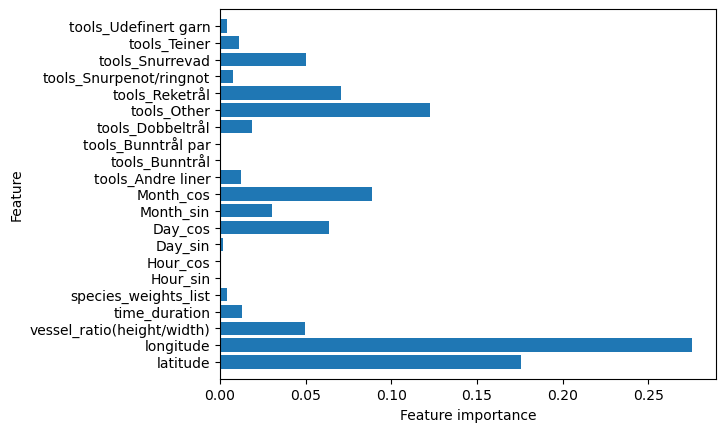

In [115]:
def plot_feature_importances_fish(model, feature_names):
    n_features_importances = len(model.feature_importances_)
    
    print(f"Number of features in dataset: {len(feature_names)}")
    print(f"Length of feature importances: {n_features_importances}")

    plt.barh(np.arange(n_features_importances), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features_importances), feature_names[:n_features_importances]) # getting the features.
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features_importances)

feature_names = result_df_train.columns.tolist()
plot_feature_importances_fish(tree, feature_names)

Now we see some interesting data from above, that perhaps decision trees dont actually capture the cyclical encoding that we do, since it seems to put more weight on Day_cos than Day_sin (two features), which is really both representing the day (one feature), but we will not consider this too much in our analysis and continue regarding it as working as it should, i recommend checking out: https://towardsdatascience.com/cyclical-features-encoding-its-about-time-ce23581845ca for more info about this potential problem.

Let's now try to use things like Randomforests and Gradient boosting:

In [116]:
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor(n_estimators=10, random_state=0, max_depth=13)
forest.fit(X_train, y_train_array)

RandomForestRegressor(max_depth=13, n_estimators=10, random_state=0)

In [117]:
print("Accuracy on training set: {:.3f}".format(forest.score(X_train, y_train_array)))
print("Accuracy on test set: {:.3f}".format(forest.score(X_test, y_test_array)))

Accuracy on training set: 0.901
Accuracy on test set: 0.803


Pretty solid score for randomforest's, we can also try GBR below: Thanks to `sklearn's MultioutputRegressor`, thanks to `amine`! https://stackoverflow.com/questions/58113265/how-to-predict-multi-outputs-using-gradient-boosting-regression

In [119]:
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import GradientBoostingRegressor

gbrt = GradientBoostingRegressor(random_state=0)

multi_output_gbrt = MultiOutputRegressor(gbrt)
multi_output_gbrt.fit(X_train, y_train_array)

train_r2_score = multi_output_gbrt.score(X_train, y_train_array)
print("Accuracy on training set: {:.3f}".format(train_r2_score))
test_r2_score = multi_output_gbrt.score(X_test, y_test_array)
print("Accuracy on test set: {:.3f}".format(test_r2_score))

Accuracy on training set: 0.768
Accuracy on test set: 0.721


### 1.3 Deep learning <a id="section_2_3"></a>

We are going to create a neural network from scratch using this source, mainly: https://machinelearningmastery.com/develop-your-first-neural-network-with-pytorch-step-by-step/ *keep in mind we are using PyTourch*

In [120]:
X_train_numpy = X_train.to_numpy()  
X_test_numpy = X_test.to_numpy() 

X_train_tensor = torch.tensor(X_train_numpy, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_array, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_numpy, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_array, dtype=torch.float32)

In [121]:
X_train_tensor.shape

torch.Size([36800, 21])

In [122]:
y_train_tensor.shape

torch.Size([36800, 7])

In [123]:
class PimaClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.hidden1 = nn.Linear(21, 30)
        self.act1 = nn.Tanh()
        self.hidden2 = nn.Linear(30, 13)
        self.act2 = nn.Tanh()
        self.output = nn.Linear(13, 7)
        #self.act_output = nn.Tanh() 
        
    def forward(self, x):
        x = self.act1(self.hidden1(x))
        x = self.act2(self.hidden2(x))
       # x = self.act_output(self.output(x))
        x = self.output(x)
        return x
 
model = PimaClassifier()
print(model)

PimaClassifier(
  (hidden1): Linear(in_features=21, out_features=30, bias=True)
  (act1): Tanh()
  (hidden2): Linear(in_features=30, out_features=13, bias=True)
  (act2): Tanh()
  (output): Linear(in_features=13, out_features=7, bias=True)
)


In [124]:
loss_fn = nn.MSELoss() #loss function
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [155]:
n_epochs = 100
batch_size = 10
patience = 5 # this can be adjusted, dependent on how much "patience" one has to getting a better model or not.
best_val_loss = float('inf')
counter = 0

for epoch in range(n_epochs):
    model.train()  # setting to training mode.
    epoch_loss = 0.0

    for i in range(0, len(X_train_tensor), batch_size):
        X_batch = X_train_tensor[i:i+batch_size]
        y_pred = model(X_batch)
        y_batch = y_train_tensor[i:i+batch_size] 
        
        loss = loss_fn(y_pred, y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item() * len(X_batch)
    
    # compute (average) training loss for the epoch
    epoch_loss /= len(X_train_tensor)
    
    
    model.eval() # setting to validation mode.
    with torch.no_grad():
        y_val_pred = model(X_test_tensor)
        val_loss = loss_fn(y_val_pred, y_test_tensor)
    
    print(f"Epoch {epoch+1}/{n_epochs}, Training Loss: {epoch_loss:.4f}, Validation Loss: {val_loss:.4f}")
    
    # checking if the val. is becoming better
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        counter = 0 # resetting the counter
    else:
        counter += 1
    
    # early stopping: Stop training if validation loss does not improve for patience epochs
    if counter >= patience:
        print(f"Validation loss did not improve for {patience} epochs. Stopping training.")
        break
# we see our model is very slowly getting better, which could perhaps mean there are better solutions to this problem.

Epoch 1/100, Training Loss: 0.0172, Validation Loss: 0.0243
Epoch 2/100, Training Loss: 0.0172, Validation Loss: 0.0243
Epoch 3/100, Training Loss: 0.0172, Validation Loss: 0.0243
Epoch 4/100, Training Loss: 0.0172, Validation Loss: 0.0243
Epoch 5/100, Training Loss: 0.0172, Validation Loss: 0.0243
Epoch 6/100, Training Loss: 0.0172, Validation Loss: 0.0243
Epoch 7/100, Training Loss: 0.0172, Validation Loss: 0.0243
Epoch 8/100, Training Loss: 0.0172, Validation Loss: 0.0243
Epoch 9/100, Training Loss: 0.0171, Validation Loss: 0.0243
Epoch 10/100, Training Loss: 0.0171, Validation Loss: 0.0243
Epoch 11/100, Training Loss: 0.0171, Validation Loss: 0.0243
Epoch 12/100, Training Loss: 0.0171, Validation Loss: 0.0243
Epoch 13/100, Training Loss: 0.0171, Validation Loss: 0.0242
Epoch 14/100, Training Loss: 0.0171, Validation Loss: 0.0242
Epoch 15/100, Training Loss: 0.0171, Validation Loss: 0.0242
Epoch 16/100, Training Loss: 0.0171, Validation Loss: 0.0242
Epoch 17/100, Training Loss: 0.01

In [156]:
# compute accuracy (no_grad is optional)
with torch.no_grad():
    y_pred = model(X_test_tensor)
 
accuracy = (y_pred.round() == y_test_tensor).float().mean()
print(f"Accuracy {accuracy}")

Accuracy 0.6388562917709351


### Unsupervised learning <a class="anchor" id="chapter3"></a>

### 1.1 Preprocessing  <a id="section_3_1"></a>

We can take the following data from the start of the preprocessing phase, since we dont need target or test data either way:

In [127]:
combined_df

,Melding ID,latitude,longitude,main_species,vessel_ratio(height/width),start_date,time_duration,total_weight,times,tools_used,species_weights_list
0,1497249,74.811,36.665,Other,4.459821,2018-01-01,101,871.0,01:19,Teiner,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 871.0]"
1,1497288,69.744,16.516,Sei,3.054444,2018-01-01,881,5304.0,05:47,Udefinert garn,"[2100.0, 2895.0, 54.0, 95.0, 0.0, 0.0, 16.0]"
2,1497306,72.866,29.105,Torsk,4.658000,2018-01-01,900,11321.0,07:00,Andre liner,"[8371.0, 0.0, 2257.0, 0.0, 0.0, 0.0, 660.0]"
3,1497310,58.636,0.876,Lange,3.467143,2018-01-01,249,2994.0,07:09,Dobbeltrål,"[188.0, 480.0, 0.0, 1392.0, 0.0, 0.0, 874.0]"
4,1497311,73.127,28.324,Torsk,4.014286,2018-01-01,87,4131.0,17:09,Bunntrål,"[3850.0, 0.0, 202.0, 0.0, 0.0, 0.0, 79.0]"
...,...,...,...,...,...,...,...,...,...,...,...
46043,1800240,74.650,36.783,Other,4.516129,2018-12-31,0,1774.0,22:17,Teiner,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1774.0]"
46044,1800245,57.774,5.861,Sei,3.261905,2018-12-31,364,1754.0,06:56,Bunntrål,"[71.0, 1062.0, 0.0, 36.0, 0.0, 0.0, 81.0]"
46045,1800252,71.317,24.700,Hyse,5.255814,2018-12-30,420,5228.0,23:00,Andre liner,"[1485.0, 0.0, 2633.0, 0.0, 0.0, 0.0, 1110.0]"
46046,1800263,75.352,14.944,Hyse,4.654545,2018-12-31,0,12307.0,23:26,Andre liner,"[4502.0, 0.0, 5295.0, 0.0, 0.0, 0.0, 2322.0]"


In [128]:
type(combined_df)

pandas.core.frame.DataFrame

In [129]:
combined_df.drop("species_weights_list", axis=1, inplace=True) # we can remove our target feature, since it dosent give us much here.

One hot encoding our main_species and tools_used, but we apply PCA on it later, so that we dont get too many dimentions.

In [130]:
combined_df = pd.concat([combined_df, pd.get_dummies(combined_df["main_species"], prefix="species").astype(int)], axis=1)

combied_df = combined_df.drop("main_species", axis=1, inplace=True)

In [131]:
combined_df

,Melding ID,latitude,longitude,vessel_ratio(height/width),start_date,time_duration,total_weight,times,tools_used,species_Blåkveite,species_Breiflabb,species_Brosme,species_Dypvannsreke,species_Hyse,species_Lange,species_Lysing,species_Other,species_Sei,species_Torsk,species_Uer (vanlig)
0,1497249,74.811,36.665,4.459821,2018-01-01,101,871.0,01:19,Teiner,0,0,0,0,0,0,0,1,0,0,0
1,1497288,69.744,16.516,3.054444,2018-01-01,881,5304.0,05:47,Udefinert garn,0,0,0,0,0,0,0,0,1,0,0
2,1497306,72.866,29.105,4.658000,2018-01-01,900,11321.0,07:00,Andre liner,0,0,0,0,0,0,0,0,0,1,0
3,1497310,58.636,0.876,3.467143,2018-01-01,249,2994.0,07:09,Dobbeltrål,0,0,0,0,0,1,0,0,0,0,0
4,1497311,73.127,28.324,4.014286,2018-01-01,87,4131.0,17:09,Bunntrål,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46043,1800240,74.650,36.783,4.516129,2018-12-31,0,1774.0,22:17,Teiner,0,0,0,0,0,0,0,1,0,0,0
46044,1800245,57.774,5.861,3.261905,2018-12-31,364,1754.0,06:56,Bunntrål,0,0,0,0,0,0,0,0,1,0,0
46045,1800252,71.317,24.700,5.255814,2018-12-30,420,5228.0,23:00,Andre liner,0,0,0,0,1,0,0,0,0,0,0
46046,1800263,75.352,14.944,4.654545,2018-12-31,0,12307.0,23:26,Andre liner,0,0,0,0,1,0,0,0,0,0,0


In [132]:
combined_df = pd.concat([combined_df, pd.get_dummies(combined_df["tools_used"], prefix="tools").astype(int)], axis=1)

combied_df = combined_df.drop("tools_used", axis=1, inplace=True)

In [133]:
combined_df

,Melding ID,latitude,longitude,vessel_ratio(height/width),start_date,time_duration,total_weight,times,species_Blåkveite,species_Breiflabb,...,tools_Bunntrål,tools_Bunntrål par,tools_Dobbeltrål,tools_Other,tools_Reketrål,tools_Snurpenot/ringnot,tools_Snurrevad,tools_Teiner,tools_Udefinert garn,tools_Udefinert trål
0,1497249,74.811,36.665,4.459821,2018-01-01,101,871.0,01:19,0,0,...,0,0,0,0,0,0,0,1,0,0
1,1497288,69.744,16.516,3.054444,2018-01-01,881,5304.0,05:47,0,0,...,0,0,0,0,0,0,0,0,1,0
2,1497306,72.866,29.105,4.658000,2018-01-01,900,11321.0,07:00,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1497310,58.636,0.876,3.467143,2018-01-01,249,2994.0,07:09,0,0,...,0,0,1,0,0,0,0,0,0,0
4,1497311,73.127,28.324,4.014286,2018-01-01,87,4131.0,17:09,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46043,1800240,74.650,36.783,4.516129,2018-12-31,0,1774.0,22:17,0,0,...,0,0,0,0,0,0,0,1,0,0
46044,1800245,57.774,5.861,3.261905,2018-12-31,364,1754.0,06:56,0,0,...,1,0,0,0,0,0,0,0,0,0
46045,1800252,71.317,24.700,5.255814,2018-12-30,420,5228.0,23:00,0,0,...,0,0,0,0,0,0,0,0,0,0
46046,1800263,75.352,14.944,4.654545,2018-12-31,0,12307.0,23:26,0,0,...,0,0,0,0,0,0,0,0,0,0


See chapter 1.2 about decision tree, to see feature importance, we will remove the least important, things like times, and time_duration:

In [134]:
combied_df = combined_df.drop("times", axis=1, inplace=True)
combied_df = combined_df.drop("time_duration", axis=1, inplace=True)

In [135]:
combied_df = combined_df.drop("Melding ID", axis=1, inplace=True) # removing Melding ID, dont need it

In [136]:
combined_df

,latitude,longitude,vessel_ratio(height/width),start_date,total_weight,species_Blåkveite,species_Breiflabb,species_Brosme,species_Dypvannsreke,species_Hyse,...,tools_Bunntrål,tools_Bunntrål par,tools_Dobbeltrål,tools_Other,tools_Reketrål,tools_Snurpenot/ringnot,tools_Snurrevad,tools_Teiner,tools_Udefinert garn,tools_Udefinert trål
0,74.811,36.665,4.459821,2018-01-01,871.0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,69.744,16.516,3.054444,2018-01-01,5304.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,72.866,29.105,4.658000,2018-01-01,11321.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,58.636,0.876,3.467143,2018-01-01,2994.0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,73.127,28.324,4.014286,2018-01-01,4131.0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46043,74.650,36.783,4.516129,2018-12-31,1774.0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
46044,57.774,5.861,3.261905,2018-12-31,1754.0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
46045,71.317,24.700,5.255814,2018-12-30,5228.0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
46046,75.352,14.944,4.654545,2018-12-31,12307.0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [137]:
new_date_df_combined = transform_from_date_to_cyclical(combined_df["start_date"])

In [138]:
date_cyclical_combined = cyclical.fit_transform(new_date_df_combined[["Day", "Month"]]) #selecting dataframe!

In [139]:
combined_df.reset_index(drop=True, inplace=True) # avoiding potential issues when concatination is happening...
date_cyclical_combined.reset_index(drop=True, inplace=True)

combined_df = pd.concat([combined_df, date_cyclical_combined[['Day_sin', 'Day_cos', 'Month_sin', 'Month_cos']]], axis=1) # adding to original dataframe

In [140]:
combined_df.drop("start_date", axis=1, inplace=True) # we can remove start_date as we now have a encoded version.

In [141]:
combined_df

,latitude,longitude,vessel_ratio(height/width),total_weight,species_Blåkveite,species_Breiflabb,species_Brosme,species_Dypvannsreke,species_Hyse,species_Lange,...,tools_Reketrål,tools_Snurpenot/ringnot,tools_Snurrevad,tools_Teiner,tools_Udefinert garn,tools_Udefinert trål,Day_sin,Day_cos,Month_sin,Month_cos
0,74.811,36.665,4.459821,871.0,0,0,0,0,0,0,...,0,0,0,1,0,0,2.012985e-01,0.97953,5.000000e-01,0.866025
1,69.744,16.516,3.054444,5304.0,0,0,0,0,0,0,...,0,0,0,0,1,0,2.012985e-01,0.97953,5.000000e-01,0.866025
2,72.866,29.105,4.658000,11321.0,0,0,0,0,0,0,...,0,0,0,0,0,0,2.012985e-01,0.97953,5.000000e-01,0.866025
3,58.636,0.876,3.467143,2994.0,0,0,0,0,0,1,...,0,0,0,0,0,0,2.012985e-01,0.97953,5.000000e-01,0.866025
4,73.127,28.324,4.014286,4131.0,0,0,0,0,0,0,...,0,0,0,0,0,0,2.012985e-01,0.97953,5.000000e-01,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46043,74.650,36.783,4.516129,1774.0,0,0,0,0,0,0,...,0,0,0,1,0,0,-2.449294e-16,1.00000,-2.449294e-16,1.000000
46044,57.774,5.861,3.261905,1754.0,0,0,0,0,0,0,...,0,0,0,0,0,0,-2.449294e-16,1.00000,-2.449294e-16,1.000000
46045,71.317,24.700,5.255814,5228.0,0,0,0,0,1,0,...,0,0,0,0,0,0,-2.012985e-01,0.97953,-2.449294e-16,1.000000
46046,75.352,14.944,4.654545,12307.0,0,0,0,0,1,0,...,0,0,0,0,0,0,-2.449294e-16,1.00000,-2.449294e-16,1.000000


In [142]:
combined_df['vessel_ratio(height/width)'] = minmax_scaler.fit_transform(combined_df[['vessel_ratio(height/width)']])

In [143]:
combined_df['latitude'] = standard_scaler.fit_transform(combined_df[['latitude']])
combined_df['longitude'] = standard_scaler.fit_transform(combined_df[['longitude']])

Robustscaler is here used, since we dont want that outliers have such a big influene, and in total_weight we know there are some outliers (some very large and some very small values).

In [144]:
combined_df['total_weight'] = robust_scaler.fit_transform(combined_df[['total_weight']])

In [145]:
combined_df

,latitude,longitude,vessel_ratio(height/width),total_weight,species_Blåkveite,species_Breiflabb,species_Brosme,species_Dypvannsreke,species_Hyse,species_Lange,...,tools_Reketrål,tools_Snurpenot/ringnot,tools_Snurrevad,tools_Teiner,tools_Udefinert garn,tools_Udefinert trål,Day_sin,Day_cos,Month_sin,Month_cos
0,1.309803,1.627054,0.460517,-0.352687,0,0,0,0,0,0,...,0,0,0,1,0,0,2.012985e-01,0.97953,5.000000e-01,0.866025
1,0.513702,0.173175,0.174123,-0.187695,0,0,0,0,0,0,...,0,0,0,0,1,0,2.012985e-01,0.97953,5.000000e-01,0.866025
2,1.004214,1.081552,0.500902,0.036251,0,0,0,0,0,0,...,0,0,0,0,0,0,2.012985e-01,0.97953,5.000000e-01,0.866025
3,-1.231530,-0.955351,0.258224,-0.273671,0,0,0,0,0,1,...,0,0,0,0,0,0,2.012985e-01,0.97953,5.000000e-01,0.866025
4,1.045221,1.025198,0.369723,-0.231353,0,0,0,0,0,0,...,0,0,0,0,0,0,2.012985e-01,0.97953,5.000000e-01,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46043,1.284507,1.635568,0.471991,-0.319078,0,0,0,0,0,0,...,0,0,0,1,0,0,-2.449294e-16,1.00000,-2.449294e-16,1.000000
46044,-1.366963,-0.595651,0.216400,-0.319823,0,0,0,0,0,0,...,0,0,0,0,0,0,-2.449294e-16,1.00000,-2.449294e-16,1.000000
46045,0.760843,0.763703,0.622728,-0.190524,0,0,0,0,1,0,...,0,0,0,0,0,0,-2.012985e-01,0.97953,-2.449294e-16,1.000000
46046,1.394802,0.059745,0.500198,0.072949,0,0,0,0,1,0,...,0,0,0,0,0,0,-2.449294e-16,1.00000,-2.449294e-16,1.000000


Now we have a full dataset, with all encoded / scaled values, lets go into some unsupervised learning:

### 1.2 Clustering <a id="section_3_2"></a>

We will use t-SNE since our data is high dimentional, with perhaps some outliers, since we know some boats have a huge difference between their total weights.

In [146]:
tsne = TSNE(n_components=2, random_state=0)

In [147]:
tsne_data = tsne.fit_transform(combined_df)

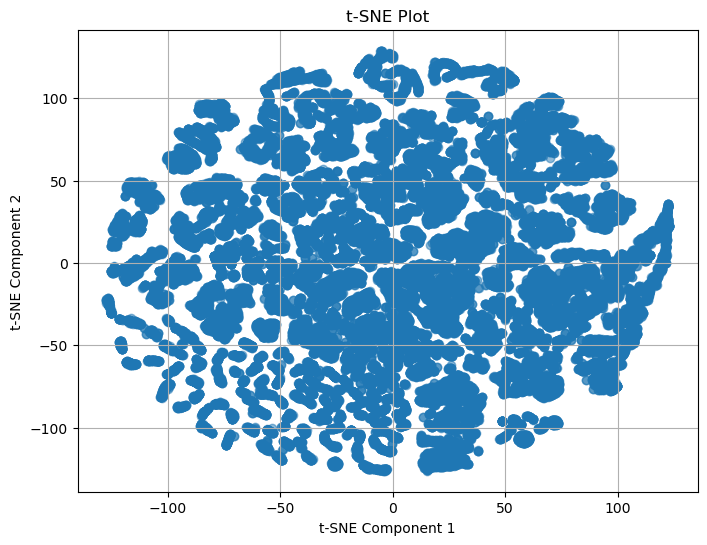

In [148]:
plt.figure(figsize=(8, 6))
plt.scatter(tsne_data[:, 0], tsne_data[:, 1], alpha=0.5)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Plot')
#plt.grid(True)
plt.show()

We can try DBSCAN, since we see that density could help our case here:

In [212]:
dbscan = DBSCAN(eps=1, min_samples=8)
dbscan.fit(tsne_data)

# cluster labels
cluster_labels = dbscan.labels_

# cluster labels, ignoring noise.
n_clusters_ = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
n_noise_ = list(cluster_labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 1187
Estimated number of noise points: 2905


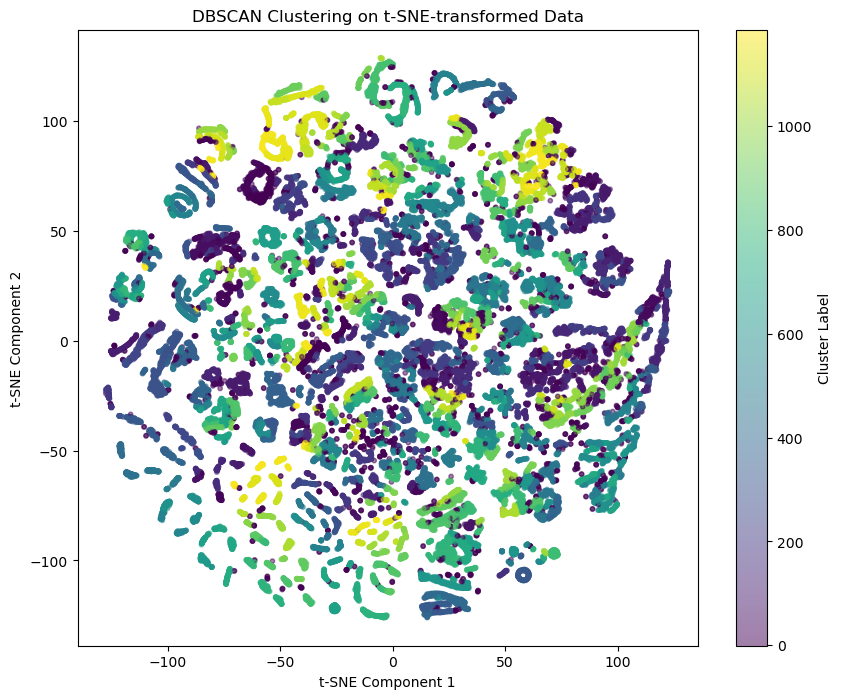

In [213]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=cluster_labels, cmap='viridis', s=10, alpha=0.5)  
plt.title('DBSCAN Clustering on t-SNE-transformed Data')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Cluster Label')

plt.show()

Evaluation of unsupervised learning, without ground truth: see: https://towardsdatascience.com/silhouette-coefficient-validating-clustering-techniques-e976bb81d10c for more

In [214]:
silhouette_avg = silhouette_score(tsne_data, cluster_labels)

print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.3204624


In [199]:
cluster_labels

array([   0,    1,    2, ...,    5,  869, 1115], dtype=int64)

Some inspiration from https://medium.com/@tarammullin/visualizing-dbscan-results-with-t-sne-plotly-e3742205c900, while also using logic from previous code, to show our "unsupervised results" in a more useful maner. 

In [215]:


# creating a df with our t-SNE components
df = pd.DataFrame(tsne_data, columns=['t-SNE Component 1', 't-SNE Component 2'])
df['Cluster Label'] = cluster_labels

# check link, using plotly to make a figure that will be interactive.
fig = px.scatter(df, x='t-SNE Component 1', y='t-SNE Component 2', color='Cluster Label',
                 title='DBSCAN Clustering on t-SNE-transformed Data', opacity=0.5,
                 hover_name=df.index, size_max=10)

# showing the figure.
fig.update_layout(
    xaxis_title='t-SNE Component 1',
    yaxis_title='t-SNE Component 2',
    coloraxis_colorbar=dict(title='Cluster Label'),
    height=800
)

fig.show()

### Evaluation: Summary and comments <a class="anchor" id="chapter4"></a>

Lets start off by saying this project was a rollercoster of ups and downs though at the end i had a lot of fun making it. Our problem was that we wanted to predict from some data, the most common species (target feature), in like a list with percentages summing to 100%, see more in our discussion section above, this was clearly a regression problem and would not be such an easy problem to try to predict. We can start off by trying to acknowledge the results we got from `Chapter 2 - Supervised Learning`, where we start off with our KNN algorithm which actually works quite well for this problem case. Though i already knew it would not catch all the complex relationships, it still did beyong my expectations. Then we try deciosion trees, this is not only because decision trees ususally are a good algortihm for a bunch of problems, but also since we had a potential problem when it came to our cyclical encoding which i wanted to test, see Section about decision trees (random forests - more specifically). It still did quite well, obviously most likely overfitted to some degree, but we also knew that because of that potential problem decision trees would perhaps not be the most optimal algorithm. Now onto the last of them, deep learning, or neural networks, it took quite a while trying to tune it to do it, but at the end it did end up doing good, perhaps it is a local minimum (and it most likely is because i had limited time), but it seemed to grasp better the more complex relationships at least to some degree. Our unsupervised learning algorithm approach went from t-SNE which actually worked really well, since PCA did a horrible job, which i scratched off the project since it did not show anything informative, working from t-SNE we continued with trying to cluster this brain-like figure, with DBSCAN, since it seemed to be a density problem from the visualization, its quite hard to do so, and perhaps DBSCAN is not the most optimal, but it worked to some degree, also showing that there is quite a lot of different spanning-data here. This we can tell since looking at the representations of both the t-SNE and DBSCAN we see some dots at left side, a kind of valley to the top-right and most of the other data seems to just be a bunch of clusters, showing off that some data is quite different than the other, but still has some meaningfull realationships - in the sense that it seems to be multiple points of this data - not only one singular, which DBSCAN is awesome at visualizing. The silhoutte score is somewhat okay, since i think it will be quite hard to be able to cluster it well, since we discussed that the data seems to have big differenting sides at some points at least - like the examples i wrote a few sentences back. 
The biggest issue i had along the project was the data, what should we use as training data and test data? I started off by just a random train_test_split at the start and some of my algorithms did not even go over a 0.2 R2 score, while my neural net did a -0.7 R2 score on testing data, while still doing quite well on the training data, what went wrong? I actually figured that since we have data spanning from the whole year (1 - 12 months), and since there is just a random split at the start, our training data could perhaps just be "exposed" (or train) on data that is in some specific months, but not all perhaps, or not enough on others, this could lead to a big inbalance, and when it came to the test data it had nothing or barely anything to go off of, so it would be bingo. This introduced me to a new problem i had to face, how should we split the data so it will generalize well across all the months of the year? (see section `Splitting the data` for more). We chose to train_test split in every month, so that we would get a lot of training and some test data to predict on for all months, which would be better for the training part (better to generalize for each given month), and for the testing part (testing on every month, since the results could be quite different from month to month), this would end up being a viable approach.

In [152]:
# End project.